In [15]:
import re
import torch
from transformers import AutoProcessor, Gemma3ForConditionalGeneration
from torchvision.datasets import CIFAR10
from torchvision import transforms
from torch.utils.data import DataLoader, Subset
import matplotlib.pyplot as plt
from tqdm import tqdm
from time import time

# 설정
model_name = "google/gemma-3-4b-it"
batch_size = 4
n_visualize = 4  # 시각화할 샘플 수 4개
MAX_NEW_TOKENS = 200
SUBSET_DATASET_SIZE = 4

def eval_gemma(model_name, batch_size, n_visualize, MAX_NEW_TOKENS, SUBSET_DATASET_SIZE, input_prompt, topk, temperature):
    # Custom collate_fn: PIL 이미지를 그대로 유지 (Tensor 변환 X)
    def pil_collate_fn(batch):
        images, labels = zip(*batch)
        return list(images), list(labels)

    # CIFAR‑10 로드 (transform 없이 → PIL 이미지 그대로)
    data_root = "/data1/bubble3jh/data/CIFAR10"
    dataset = CIFAR10(root=data_root, train=False, download=True)
    subset_dataset = Subset(dataset, list(range(SUBSET_DATASET_SIZE)))
    dataloader = DataLoader(subset_dataset, batch_size=batch_size, shuffle=False, collate_fn=pil_collate_fn)

    # PIL 이미지 resize (Gemma3는 보통 224×224 입력을 기대)
    resize = transforms.Resize((224, 224))

    # processor와 모델 로드 (image-text-to-text 전용)
    processor = AutoProcessor.from_pretrained(model_name)
    model = Gemma3ForConditionalGeneration.from_pretrained(
        model_name, torch_dtype=torch.bfloat16, device_map='auto'
    )
    model.eval()

    def postprocess_output(raw_text):
        """
        raw_text에서 "\nmodel\n" 이후의 문자열을 추출한 후, 
        앞뒤 공백과 구두점(.,:;!? 등)을 제거합니다.
        """
        if "\nmodel\n" in raw_text:
            raw_text = raw_text.split("\nmodel\n")[-1]
        cleaned = raw_text.strip().strip(".,:;!?")
        return cleaned.lower()

    # 기존 normalize_and_tokenize 함수는 제거하거나, 
    # 정답 비교 시 구두점과 Markdown 기호 처리를 위해 직접 처리합니다.
    def contains_label(pred, gt):
        """
        출력(pred) 텍스트를 소문자로 변환하고, Markdown 기호(*, _, `) 및
        내부 구두점도 제거한 후, 정규표현식의 단어 경계를 사용해 정답(gt)과 매치되는지 판단합니다.
        """
        # 소문자 변환 및 Markdown 기호 제거
        clean_pred = re.sub(r'[*_`]', '', pred.lower())
        # 정규표현식을 이용해 단어 경계 매칭:
        # \b를 사용하면 'cat'이 'cat.' 또는 '**cat**' 등과 정확히 매치됨.
        return re.search(r'\b' + re.escape(gt) + r'\b', clean_pred) is not None

    def get_unique_preds_for_sample(single_conversation, initial_unique_preds, min_unique=5, max_iter=3):
        unique_preds = initial_unique_preds.copy()
        iter_count = 0
        single_input = processor.apply_chat_template(
            single_conversation,
            tokenize=True,
            return_dict=True,
            return_tensors="pt",
            add_generation_prompt=True,
            do_pan_and_scan=True
        ).to("cuda")
        
        while len(unique_preds) < min_unique and iter_count < max_iter:
            extra_outputs = model.generate(
                **single_input,
                max_new_tokens=MAX_NEW_TOKENS,
                do_sample=True,          # 무작위성 도입
                top_k=topk,                # 상위 k개 중 무작위 선택
                temperature=temperature,   # 출력 분포의 평탄화 조절
                num_return_sequences=10,   # 다양한 결과 확보
                return_dict_in_generate=True,
            )
            extra_preds = processor.batch_decode(extra_outputs.sequences, skip_special_tokens=True)
            extra_preds = [postprocess_output(pred) for pred in extra_preds]
            for pred in extra_preds:
                if pred not in unique_preds:
                    unique_preds.append(pred)
                    if len(unique_preds) == min_unique:
                        break
            iter_count += 1
        return unique_preds

    # 평가 및 시각화를 위한 변수
    correct_top1 = 0
    correct_top5 = 0
    total = 0
    visual_data = []  # 시각화용: top1 결과와 고유한 top5 후보

    start_time = time()

    with torch.no_grad():
        for images, labels in tqdm(dataloader, desc="Batched inference"):
            resized_images = [resize(img) for img in images]
            gt_labels = [dataset.classes[l].lower() for l in labels]

            conversations = [
                [
                    {
                        "role": "user",
                        "content": [
                            {"type": "image", "image": img},
                            {"type": "text", "text": input_prompt}
                        ]
                    }
                ]
                for img in resized_images
            ]

            inputs = processor.apply_chat_template(
                conversations,
                tokenize=True,
                return_dict=True,
                return_tensors="pt",
                add_generation_prompt=True,
                do_pan_and_scan=True
            ).to("cuda")
            
            outputs = model.generate(
                **inputs,
                max_new_tokens=MAX_NEW_TOKENS,
                do_sample=True,
                top_k=topk,
                temperature=temperature,
                num_return_sequences=10,
                return_dict_in_generate=True,
            )
            
            decoded_outputs = processor.batch_decode(outputs.sequences, skip_special_tokens=True)
            
            for i in range(len(labels)):
                beam_outputs = decoded_outputs[i*10:(i+1)*10]
                beam_outputs = [postprocess_output(b) for b in beam_outputs]
                
                unique_preds = []
                for pred in beam_outputs:
                    if pred not in unique_preds:
                        unique_preds.append(pred)
                    if len(unique_preds) == 5:
                        break
                
                if len(unique_preds) < 5:
                    unique_preds = get_unique_preds_for_sample(conversations[i], unique_preds, min_unique=5, max_iter=3)
                
                top1_pred = unique_preds[0] if unique_preds else ""
                is_top1_correct = contains_label(top1_pred, gt_labels[i])
                if is_top1_correct:
                    correct_top1 += 1
                
                is_top5_correct = any(contains_label(pred, gt_labels[i]) for pred in unique_preds)
                if is_top5_correct:
                    correct_top5 += 1
                
                if total < n_visualize:
                    visual_data.append((resized_images[i], gt_labels[i], unique_preds, is_top1_correct, is_top5_correct))
                total += 1

    torch.cuda.empty_cache()
    elapsed = time() - start_time

    fig, axes = plt.subplots(2, n_visualize // 2, figsize=(8, 5), gridspec_kw={'hspace': 0.4})
    for idx, (image, gt, unique_preds, is_top1_correct, is_top5_correct) in enumerate(visual_data):
        ax = axes[idx // (n_visualize // 2)][idx % (n_visualize // 2)]
        ax.imshow(image)
        ax.axis("off")

        safe_preds = [pred.replace('%', '%%') for pred in unique_preds]
        gt_safe = gt.replace('%', '%%')
        title_text = f"GT: {gt_safe}\nTop1: {safe_preds[0] if safe_preds else 'N/A'}\nTop5: {', '.join(safe_preds)}"

        if is_top1_correct:
            color = "blue"
        elif is_top5_correct:
            color = "green"
        else:
            color = "red"

        ax.set_title(title_text, fontsize=8, color=color)

    plt.suptitle(f"[Sample Visualization] Top1 Acc: {correct_top1 / total * 100:.2f}% | Top5 Acc: {correct_top5 / total * 100:.2f}%", fontsize=14)
    plt.tight_layout()
    plt.show()

    print(f"\n✅ Top1 Accuracy: {correct_top1}/{total} = {correct_top1 / total * 100:.2f}%")
    print(f"✅ Top5 Accuracy: {correct_top5}/{total} = {correct_top5 / total * 100:.2f}%")
    print(f"⏱️ Elapsed time: {elapsed:.2f} sec for {total} samples")
    
    return visual_data


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.48, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Batched inference: 100%|██████████| 25/25 [01:23<00:00,  3.36s/it]


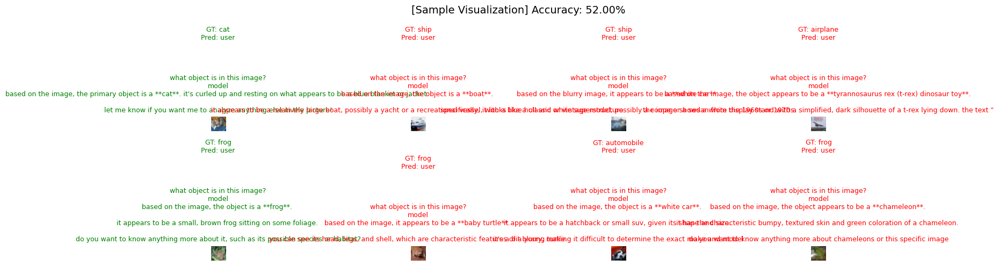


✅ Accuracy: 52/100 = 52.00%
⏱️ Elapsed time: 83.99 sec for 100 samples


In [1]:
import torch
from transformers import AutoProcessor, Gemma3ForConditionalGeneration
from torchvision.datasets import CIFAR10
from torchvision import transforms
from torch.utils.data import DataLoader, Subset
import matplotlib.pyplot as plt
from tqdm import tqdm
from time import time

# 설정
model_name = "google/gemma-3-4b-it"
batch_size = 4
n_visualize = 8

# Custom collate_fn: PIL 이미지를 그대로 유지 (Tensor 변환 X)
def pil_collate_fn(batch):
    images, labels = zip(*batch)
    return list(images), list(labels)

# CIFAR‑10 로드 (transform 없이 → PIL 이미지 그대로)
data_root = "/data1/bubble3jh/data/CIFAR10"
dataset = CIFAR10(root=data_root, train=False, download=True)
# 데이터셋의 처음 100개만 사용
subset_dataset = Subset(dataset, list(range(100)))
dataloader = DataLoader(subset_dataset, batch_size=batch_size, shuffle=False, collate_fn=pil_collate_fn)

# PIL 이미지 resize (Gemma3는 보통 224×224 입력을 기대)
resize = transforms.Resize((224, 224))

# processor와 모델 로드 (image-text-to-text 전용)
processor = AutoProcessor.from_pretrained(model_name)
model = Gemma3ForConditionalGeneration.from_pretrained(
    model_name, torch_dtype=torch.bfloat16
).to("cuda")
model.eval()

# 정확도 및 시각화를 위한 변수
correct = 0
total = 0
visual_data = []

start_time = time()

# 배치 처리 루프
for images, labels in tqdm(dataloader, desc="Batched inference"):
    # 각 이미지를 resize 처리
    resized_images = [resize(img) for img in images]
    gt_labels = [dataset.classes[l].lower() for l in labels]

    # 예시에서는 system 메시지 없이, 단순히 user 메시지로만 구성합니다.
    # processor.apply_chat_template()는 내부에서 적절히 generation prompt를 추가합니다.
    conversations = [
        [
            {
                "role": "user",
                "content": [
                    {"type": "image", "image": img},
                    {"type": "text", "text": "What object is in this image?"}
                ]
            }
        ]
        for img in resized_images
    ]

    inputs = processor.apply_chat_template(
        conversations,
        tokenize=True,
        return_dict=True,
        return_tensors="pt",
        add_generation_prompt=True,
        do_pan_and_scan=True
    )
    
    outputs = model.generate(**inputs, max_new_tokens=50)
    decoded_outputs = processor.batch_decode(outputs, skip_special_tokens=True)
    
    # decoded_outputs: 각 대화의 전체 텍스트 (generation prompt가 추가된 상태)
    for i, output_text in enumerate(decoded_outputs):
        pred = output_text.lower()
        gt = gt_labels[i]
        is_correct = gt in pred  # 간단한 포함 여부 체크
        if is_correct:
            correct += 1
        if total < n_visualize:
            visual_data.append((resized_images[i], gt, pred, is_correct))
        total += 1

elapsed = time() - start_time

# 시각화: 첫 n_visualize 샘플 grid 출력 (정답 여부에 따라 타이틀 색상)
fig, axes = plt.subplots(2, n_visualize // 2, figsize=(16, 5))
for idx, (image, gt, pred, is_correct) in enumerate(visual_data):
    ax = axes[idx // (n_visualize // 2)][idx % (n_visualize // 2)]
    ax.imshow(image)
    ax.axis("off")
    color = "green" if is_correct else "red"
    ax.set_title(f"GT: {gt}\nPred: {pred}", fontsize=9, color=color)

plt.suptitle(f"[Sample Visualization] Accuracy: {correct / total * 100:.2f}%", fontsize=14)
plt.tight_layout()
plt.show()

print(f"\n✅ Accuracy: {correct}/{total} = {correct / total * 100:.2f}%")
print(f"⏱️ Elapsed time: {elapsed:.2f} sec for {total} samples")


In [ ]:
import torch
from transformers import AutoProcessor, Gemma3ForConditionalGeneration
from torchvision.datasets import CIFAR10
from torchvision import transforms
from torch.utils.data import DataLoader, Subset
import matplotlib.pyplot as plt
from tqdm import tqdm
from time import time

# 설정
model_name = "google/gemma-3-4b-it"
batch_size = 4
n_visualize = 2

# Custom collate_fn: PIL 이미지를 그대로 유지 (Tensor 변환 X)
def pil_collate_fn(batch):
    images, labels = zip(*batch)
    return list(images), list(labels)

# CIFAR‑10 로드 (transform 없이 → PIL 이미지 그대로)
data_root = "/data1/bubble3jh/data/CIFAR10"
dataset = CIFAR10(root=data_root, train=False, download=True)
# 데이터셋의 처음 100개만 사용
subset_dataset = Subset(dataset, list(range(100)))
dataloader = DataLoader(subset_dataset, batch_size=batch_size, shuffle=False, collate_fn=pil_collate_fn)

# PIL 이미지 resize (Gemma3는 보통 224×224 입력을 기대)
resize = transforms.Resize((224, 224))

# processor와 모델 로드 (image-text-to-text 전용)
processor = AutoProcessor.from_pretrained(model_name, torch_dtype=torch.bfloat16, device_map='auto')
model = Gemma3ForConditionalGeneration.from_pretrained(
    model_name, torch_dtype=torch.bfloat16, device_map='auto'
)
model.eval()

# 정확도 및 시각화를 위한 변수
correct_top1 = 0
correct_top5 = 0
total = 0
visual_data = []  # top1 결과 시각화

start_time = time()

# 배치 처리 루프
with torch.no_grad():
    for images, labels in tqdm(dataloader, desc="Batched inference"):
        # 각 이미지를 resize 처리
        resized_images = [resize(img) for img in images]
        gt_labels = [dataset.classes[l].lower() for l in labels]

        # 대화 생성: 각 이미지에 대해 동일하게 구성
        conversations = [
            [
                {
                    "role": "user",
                    "content": [
                        {"type": "image", "image": img},
                        {"type": "text", "text": "What object is in this image?"}
                    ]
                }
            ]
            for img in resized_images
        ]

        inputs = processor.apply_chat_template(
            conversations,
            tokenize=True,
            return_dict=True,
            return_tensors="pt",
            add_generation_prompt=True,
            do_pan_and_scan=True
        )
        
        # Beam search를 이용하여 top-5 후보 생성
        outputs = model.generate(
            **inputs,
            max_new_tokens=50,
            num_beams=5,
            num_return_sequences=5,
            output_scores=True,
            return_dict_in_generate=True
        )
        
        # 생성된 sequences: 배치 당 (batch_size * 5) 결과가 있음
        decoded_outputs = processor.batch_decode(outputs.sequences, skip_special_tokens=True)
        
        # 배치 내 각 샘플에 대해 top-5 결과 추출
        for i in range(len(labels)):
            # 각 샘플에 대해 5개 후보: 인덱스 i*5부터 i*5+5까지
            beam_outputs = decoded_outputs[i*5:(i+1)*5]
            # 모두 소문자로 변환
            beam_outputs = [b.lower() for b in beam_outputs]
            top1_pred = beam_outputs[0]
            # top-1 평가: 첫번째 결과에 정답이 포함되는지
            is_top1_correct = gt_labels[i] in top1_pred
            if is_top1_correct:
                correct_top1 += 1
            # top-5 평가: 5개 후보 중 하나라도 정답 포함되는지
            is_top5_correct = any(gt_labels[i] in pred for pred in beam_outputs)
            if is_top5_correct:
                correct_top5 += 1

            if total < n_visualize:
                # 시각화에는 top1 결과와 top5 후보 전체를 기록할 수 있음
                visual_data.append((resized_images[i], gt_labels[i], beam_outputs, is_top1_correct, is_top5_correct))
            total += 1
torch.cuda.empty_cache()
elapsed = time() - start_time

# 시각화: 첫 n_visualize 샘플 grid 출력 (top-1 결과 및 정답 여부 표시)
fig, axes = plt.subplots(2, n_visualize // 2, figsize=(16, 5))
for idx, (image, gt, beam_outputs, is_top1_correct, is_top5_correct) in enumerate(visual_data):
    ax = axes[idx // (n_visualize // 2)][idx % (n_visualize // 2)]
    ax.imshow(image)
    ax.axis("off")
    # 타이틀에 top-1 결과와 top5 후보 표시 (정답 포함 여부 색상: top1 기준)
    title_text = f"GT: {gt}\nTop1: {beam_outputs[0]}\nTop5: {', '.join(beam_outputs)}"
    color = "green" if is_top1_correct else "red"
    ax.set_title(title_text, fontsize=8, color=color)

plt.suptitle(f"[Sample Visualization] Top1 Acc: {correct_top1 / total * 100:.2f}% | Top5 Acc: {correct_top5 / total * 100:.2f}%", fontsize=14)
plt.tight_layout()
plt.show()

print(f"\n✅ Top1 Accuracy: {correct_top1}/{total} = {correct_top1 / total * 100:.2f}%")
print(f"✅ Top5 Accuracy: {correct_top5}/{total} = {correct_top5 / total * 100:.2f}%")
print(f"⏱️ Elapsed time: {elapsed:.2f} sec for {total} samples")


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Batched inference:   0%|          | 0/25 [00:00<?, ?it/s]/data1/bubble3jh/anaconda/envs/coe/lib/python3.11/site-packages/transformers/generation/utils.py:2132: UserWarning: You are calling .generate() with the `input_ids` being on a device type different than your model's device. `input_ids` is on cpu, whereas the model is on cuda. You may experience unexpected behaviors or slower generation. Please make sure that you have put `input_ids` to the correct device by calling for example input_ids = input_ids.to('cuda') before running `.generate()`.
  warnings.warn(
Batched inference:   4%|▍         | 1/25 [00:32<13:06, 32.78s/it]


KeyboardInterrupt: 

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.48, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Batched inference:   0%|          | 0/75 [00:00<?, ?it/s]/data1/bubble3jh/anaconda/envs/coe/lib/python3.11/site-packages/transformers/generation/configuration_utils.py:634: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.95` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
/data1/bubble3jh/anaconda/envs/coe/lib/python3.11/site-packages/transformers/generation/configuration_utils.py:651: UserWarning: `do_sample` is set to `False`. However, `top_k` is set to `64` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_k`.
  warnings.warn(
Batched inference: 100%|██████████| 75/75 [17:01<00:00, 13.62s/it]
/tmp/ipykernel_3171873/1481943452.py:191: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


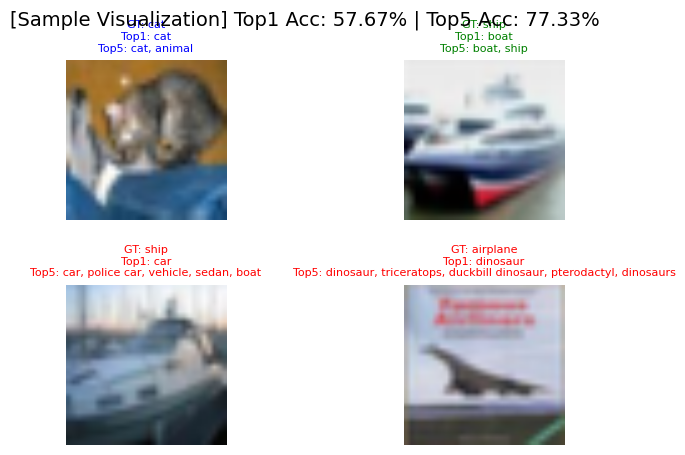


✅ Top1 Accuracy: 173/300 = 57.67%
✅ Top5 Accuracy: 232/300 = 77.33%
⏱️ Elapsed time: 1021.45 sec for 300 samples


In [1]:
import re
import torch
from transformers import AutoProcessor, Gemma3ForConditionalGeneration
from torchvision.datasets import CIFAR10
from torchvision import transforms
from torch.utils.data import DataLoader, Subset
import matplotlib.pyplot as plt
from tqdm import tqdm
from time import time

# 설정
model_name = "google/gemma-3-4b-it"
batch_size = 4
n_visualize = 4  # 시각화할 샘플 수 4개

# Custom collate_fn: PIL 이미지를 그대로 유지 (Tensor 변환 X)
def pil_collate_fn(batch):
    images, labels = zip(*batch)
    return list(images), list(labels)

# CIFAR‑10 로드 (transform 없이 → PIL 이미지 그대로)
data_root = "/data1/bubble3jh/data/CIFAR10"
dataset = CIFAR10(root=data_root, train=False, download=True)
# 데이터셋의 처음 100개만 사용
subset_dataset = Subset(dataset, list(range(300)))
dataloader = DataLoader(subset_dataset, batch_size=batch_size, shuffle=False, collate_fn=pil_collate_fn)

# PIL 이미지 resize (Gemma3는 보통 224×224 입력을 기대)
resize = transforms.Resize((224, 224))

# processor와 모델 로드 (image-text-to-text 전용)
processor = AutoProcessor.from_pretrained(model_name)
model = Gemma3ForConditionalGeneration.from_pretrained(
    model_name, torch_dtype=torch.bfloat16, device_map='auto'
)
model.eval()

def postprocess_output(raw_text):
    """
    raw_text에서 "\nmodel\n" 이후의 문자열를 추출한 후, 
    앞뒤 공백과 구두점(.,:;!? 등)을 제거합니다.
    """
    if "\nmodel\n" in raw_text:
        # "\nmodel\n" 이후의 텍스트 추출
        raw_text = raw_text.split("\nmodel\n")[-1]
    # 앞뒤 공백 및 구두점 제거
    cleaned = raw_text.strip().strip(".,:;!?")
    return cleaned.lower()

# 평가 시, 정규화 및 토큰화 함수는 그대로 사용 (필요 시 수정)
def normalize_and_tokenize(text):
    text = text.lower()
    tokens = re.split(r'[\s,/]+', text)
    tokens = [t for t in tokens if t]
    return tokens

def contains_label(pred, gt):
    tokens = normalize_and_tokenize(pred)
    return gt in tokens

def get_unique_preds_for_sample(single_conversation, initial_unique_preds, min_unique=5, max_iter=3):
    unique_preds = initial_unique_preds.copy()
    iter_count = 0
    single_input = processor.apply_chat_template(
        single_conversation,
        tokenize=True,
        return_dict=True,
        return_tensors="pt",
        add_generation_prompt=True,
        do_pan_and_scan=True
    ).to("cuda")
    
    while len(unique_preds) < min_unique and iter_count < max_iter:
        extra_outputs = model.generate(
            **single_input,
            max_new_tokens=50,
            do_sample=True,
            top_k=50,
            num_return_sequences=5,
        )
        extra_preds = processor.batch_decode(extra_outputs, skip_special_tokens=True)
        # 후처리 적용: "\nmodel\n" 이후 텍스트 추출 후 클린업
        extra_preds = [postprocess_output(pred) for pred in extra_preds]
        for pred in extra_preds:
            if pred not in unique_preds:
                unique_preds.append(pred)
                if len(unique_preds) == min_unique:
                    break
        iter_count += 1
    return unique_preds

# 평가 및 시각화를 위한 변수
correct_top1 = 0
correct_top5 = 0
total = 0
visual_data = []  # 시각화용: top1 결과와 고유한 top5 후보

start_time = time()

# 배치 처리 루프
with torch.no_grad():
    for images, labels in tqdm(dataloader, desc="Batched inference"):
        resized_images = [resize(img) for img in images]
        gt_labels = [dataset.classes[l].lower() for l in labels]

        conversations = [
            [
                {
                    "role": "user",
                    "content": [
                        {"type": "image", "image": img},
                        {"type": "text", "text": "What object is in this image? Please answer only the class name"}
                    ]
                }
            ]
            for img in resized_images
        ]

        inputs = processor.apply_chat_template(
            conversations,
            tokenize=True,
            return_dict=True,
            return_tensors="pt",
            add_generation_prompt=True,
            do_pan_and_scan=True
        ).to("cuda")
        
        # diverse beam search 하이퍼파라미터 조정
        outputs = model.generate(
            **inputs,
            max_new_tokens=50,
            num_beams=10,
            num_return_sequences=10,
            num_beam_groups=5,
            diversity_penalty=1.5,
            output_scores=False,
            return_dict_in_generate=True,
            do_sample=False,
        )
        
        decoded_outputs = processor.batch_decode(outputs.sequences, skip_special_tokens=True)
        
        for i in range(len(labels)):
            beam_outputs = decoded_outputs[i*10:(i+1)*10]
            # 후처리: "\nmodel\n" 이후의 텍스트 추출 및 클린업
            beam_outputs = [postprocess_output(b) for b in beam_outputs]
            
            unique_preds = []
            for pred in beam_outputs:
                if pred not in unique_preds:
                    unique_preds.append(pred)
                if len(unique_preds) == 5:
                    break
            
            if len(unique_preds) < 5:
                unique_preds = get_unique_preds_for_sample(conversations[i], unique_preds, min_unique=5, max_iter=3)
            
            top1_pred = unique_preds[0] if unique_preds else ""
            is_top1_correct = contains_label(top1_pred, gt_labels[i])
            if is_top1_correct:
                correct_top1 += 1
            
            is_top5_correct = any(contains_label(pred, gt_labels[i]) for pred in unique_preds)
            if is_top5_correct:
                correct_top5 += 1
            
            if total < n_visualize:
                visual_data.append((resized_images[i], gt_labels[i], unique_preds, is_top1_correct, is_top5_correct))
            total += 1

torch.cuda.empty_cache()
elapsed = time() - start_time

fig, axes = plt.subplots(2, n_visualize // 2, figsize=(8, 5), gridspec_kw={'hspace': 0.4})  # row 간 여백 추가
for idx, (image, gt, unique_preds, is_top1_correct, is_top5_correct) in enumerate(visual_data):
    ax = axes[idx // (n_visualize // 2)][idx % (n_visualize // 2)]
    ax.imshow(image)
    ax.axis("off")
    title_text = f"GT: {gt}\nTop1: {unique_preds[0] if unique_preds else 'N/A'}\nTop5: {', '.join(unique_preds)}"

    if is_top1_correct:
        color = "blue"
    elif is_top5_correct:
        color = "green"
    else:
        color = "red"

    ax.set_title(title_text, fontsize=8, color=color)



plt.suptitle(f"[Sample Visualization] Top1 Acc: {correct_top1 / total * 100:.2f}% | Top5 Acc: {correct_top5 / total * 100:.2f}%", fontsize=14)
plt.tight_layout()
plt.show()

print(f"\n✅ Top1 Accuracy: {correct_top1}/{total} = {correct_top1 / total * 100:.2f}%")
print(f"✅ Top5 Accuracy: {correct_top5}/{total} = {correct_top5 / total * 100:.2f}%")
print(f"⏱️ Elapsed time: {elapsed:.2f} sec for {total} samples")


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Batched inference:   0%|          | 0/75 [00:00<?, ?it/s]/data1/bubble3jh/anaconda/envs/coe/lib/python3.11/site-packages/transformers/generation/configuration_utils.py:634: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.95` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
/data1/bubble3jh/anaconda/envs/coe/lib/python3.11/site-packages/transformers/generation/configuration_utils.py:651: UserWarning: `do_sample` is set to `False`. However, `top_k` is set to `64` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_k`.
  warnings.warn(
Batched inference: 100%|██████████| 75/75 [29:51<00:00, 23.89s/it]
/tmp/ipykernel_423038/1119301757.py:193: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


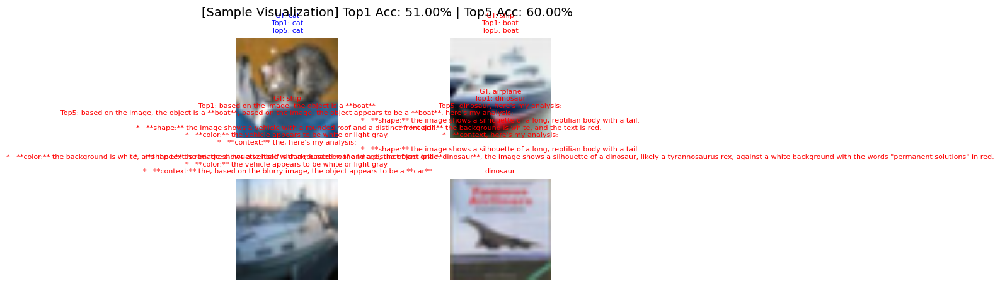


✅ Top1 Accuracy: 153/300 = 51.00%
✅ Top5 Accuracy: 180/300 = 60.00%
⏱️ Elapsed time: 1791.61 sec for 300 samples


In [2]:
import re
import torch
from transformers import AutoProcessor, Gemma3ForConditionalGeneration
from torchvision.datasets import CIFAR10
from torchvision import transforms
from torch.utils.data import DataLoader, Subset
import matplotlib.pyplot as plt
from tqdm import tqdm
from time import time

# 설정
model_name = "google/gemma-3-4b-it"
batch_size = 4
n_visualize = 4  # 시각화할 샘플 수 4개

# Custom collate_fn: PIL 이미지를 그대로 유지 (Tensor 변환 X)
def pil_collate_fn(batch):
    images, labels = zip(*batch)
    return list(images), list(labels)

# CIFAR‑10 로드 (transform 없이 → PIL 이미지 그대로)
data_root = "/data1/bubble3jh/data/CIFAR10"
dataset = CIFAR10(root=data_root, train=False, download=True)
# 데이터셋의 처음 100개만 사용
subset_dataset = Subset(dataset, list(range(300)))
dataloader = DataLoader(subset_dataset, batch_size=batch_size, shuffle=False, collate_fn=pil_collate_fn)

# PIL 이미지 resize (Gemma3는 보통 224×224 입력을 기대)
resize = transforms.Resize((224, 224))

# processor와 모델 로드 (image-text-to-text 전용)
processor = AutoProcessor.from_pretrained(model_name)
model = Gemma3ForConditionalGeneration.from_pretrained(
    model_name, torch_dtype=torch.bfloat16, device_map='auto'
)
model.eval()

def postprocess_output(raw_text):
    """
    raw_text에서 "\nmodel\n" 이후의 문자열를 추출한 후, 
    앞뒤 공백과 구두점(.,:;!? 등)을 제거합니다.
    """
    if "\nmodel\n" in raw_text:
        # "\nmodel\n" 이후의 텍스트 추출
        raw_text = raw_text.split("\nmodel\n")[-1]
    # 앞뒤 공백 및 구두점 제거
    cleaned = raw_text.strip().strip(".,:;!?")
    return cleaned.lower()

# 평가 시, 정규화 및 토큰화 함수는 그대로 사용 (필요 시 수정)
def normalize_and_tokenize(text):
    text = text.lower()
    tokens = re.split(r'[\s,/]+', text)
    tokens = [t for t in tokens if t]
    return tokens

def contains_label(pred, gt):
    tokens = normalize_and_tokenize(pred)
    return gt in tokens

def get_unique_preds_for_sample(single_conversation, initial_unique_preds, min_unique=5, max_iter=3):
    unique_preds = initial_unique_preds.copy()
    iter_count = 0
    single_input = processor.apply_chat_template(
        single_conversation,
        tokenize=True,
        return_dict=True,
        return_tensors="pt",
        add_generation_prompt=True,
        do_pan_and_scan=True
    ).to("cuda")
    
    while len(unique_preds) < min_unique and iter_count < max_iter:
        extra_outputs = model.generate(
            **single_input,
            max_new_tokens=50,
            do_sample=True,
            top_k=50,
            num_return_sequences=5,
        )
        extra_preds = processor.batch_decode(extra_outputs, skip_special_tokens=True)
        # 후처리 적용: "\nmodel\n" 이후 텍스트 추출 후 클린업
        extra_preds = [postprocess_output(pred) for pred in extra_preds]
        for pred in extra_preds:
            if pred not in unique_preds:
                unique_preds.append(pred)
                if len(unique_preds) == min_unique:
                    break
        iter_count += 1
    return unique_preds

# 평가 및 시각화를 위한 변수
correct_top1 = 0
correct_top5 = 0
total = 0
visual_data = []  # 시각화용: top1 결과와 고유한 top5 후보

start_time = time()

# 배치 처리 루프
with torch.no_grad():
    for images, labels in tqdm(dataloader, desc="Batched inference"):
        resized_images = [resize(img) for img in images]
        gt_labels = [dataset.classes[l].lower() for l in labels]

        conversations = [
            [
                {
                    "role": "user",
                    "content": [
                        {"type": "image", "image": img},
                        {"type": "text", "text": "What object is in this image? First, think step by step about the visual features such as shape, color, and context. Then, based on your reasoning, output only the object class name."}
                    ]
                }
            ]
            for img in resized_images
        ]

        inputs = processor.apply_chat_template(
            conversations,
            tokenize=True,
            return_dict=True,
            return_tensors="pt",
            add_generation_prompt=True,
            do_pan_and_scan=True
        ).to("cuda")
        
        # diverse beam search 하이퍼파라미터 조정
        outputs = model.generate(
            **inputs,
            max_new_tokens=50,
            num_beams=10,
            num_return_sequences=10,
            num_beam_groups=5,
            diversity_penalty=1.5,
            output_scores=False,
            return_dict_in_generate=True,
            do_sample=False,
        )
        
        decoded_outputs = processor.batch_decode(outputs.sequences, skip_special_tokens=True)
        
        for i in range(len(labels)):
            beam_outputs = decoded_outputs[i*10:(i+1)*10]
            # 후처리: "\nmodel\n" 이후의 텍스트 추출 및 클린업
            beam_outputs = [postprocess_output(b) for b in beam_outputs]
            
            unique_preds = []
            for pred in beam_outputs:
                if pred not in unique_preds:
                    unique_preds.append(pred)
                if len(unique_preds) == 5:
                    break
            
            if len(unique_preds) < 5:
                unique_preds = get_unique_preds_for_sample(conversations[i], unique_preds, min_unique=5, max_iter=3)
            
            top1_pred = unique_preds[0] if unique_preds else ""
            is_top1_correct = contains_label(top1_pred, gt_labels[i])
            if is_top1_correct:
                correct_top1 += 1
            
            is_top5_correct = any(contains_label(pred, gt_labels[i]) for pred in unique_preds)
            if is_top5_correct:
                correct_top5 += 1
            
            if total < n_visualize:
                visual_data.append((resized_images[i], gt_labels[i], unique_preds, is_top1_correct, is_top5_correct))
            total += 1

torch.cuda.empty_cache()
elapsed = time() - start_time

fig, axes = plt.subplots(2, n_visualize // 2, figsize=(8, 5), gridspec_kw={'hspace': 0.4})  # row 간 여백 추가
for idx, (image, gt, unique_preds, is_top1_correct, is_top5_correct) in enumerate(visual_data):
    ax = axes[idx // (n_visualize // 2)][idx % (n_visualize // 2)]
    ax.imshow(image)
    ax.axis("off")
    title_text = f"GT: {gt}\nTop1: {unique_preds[0] if unique_preds else 'N/A'}\nTop5: {', '.join(unique_preds)}"

    if is_top1_correct:
        color = "blue"
    elif is_top5_correct:
        color = "green"
    else:
        color = "red"

    ax.set_title(title_text, fontsize=8, color=color)



plt.suptitle(f"[Sample Visualization] Top1 Acc: {correct_top1 / total * 100:.2f}% | Top5 Acc: {correct_top5 / total * 100:.2f}%", fontsize=14)
plt.tight_layout()
plt.show()

print(f"\n✅ Top1 Accuracy: {correct_top1}/{total} = {correct_top1 / total * 100:.2f}%")
print(f"✅ Top5 Accuracy: {correct_top5}/{total} = {correct_top5 / total * 100:.2f}%")
print(f"⏱️ Elapsed time: {elapsed:.2f} sec for {total} samples")


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Batched inference: 100%|██████████| 1/1 [00:24<00:00, 24.71s/it]
/tmp/ipykernel_423038/1453905474.py:205: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


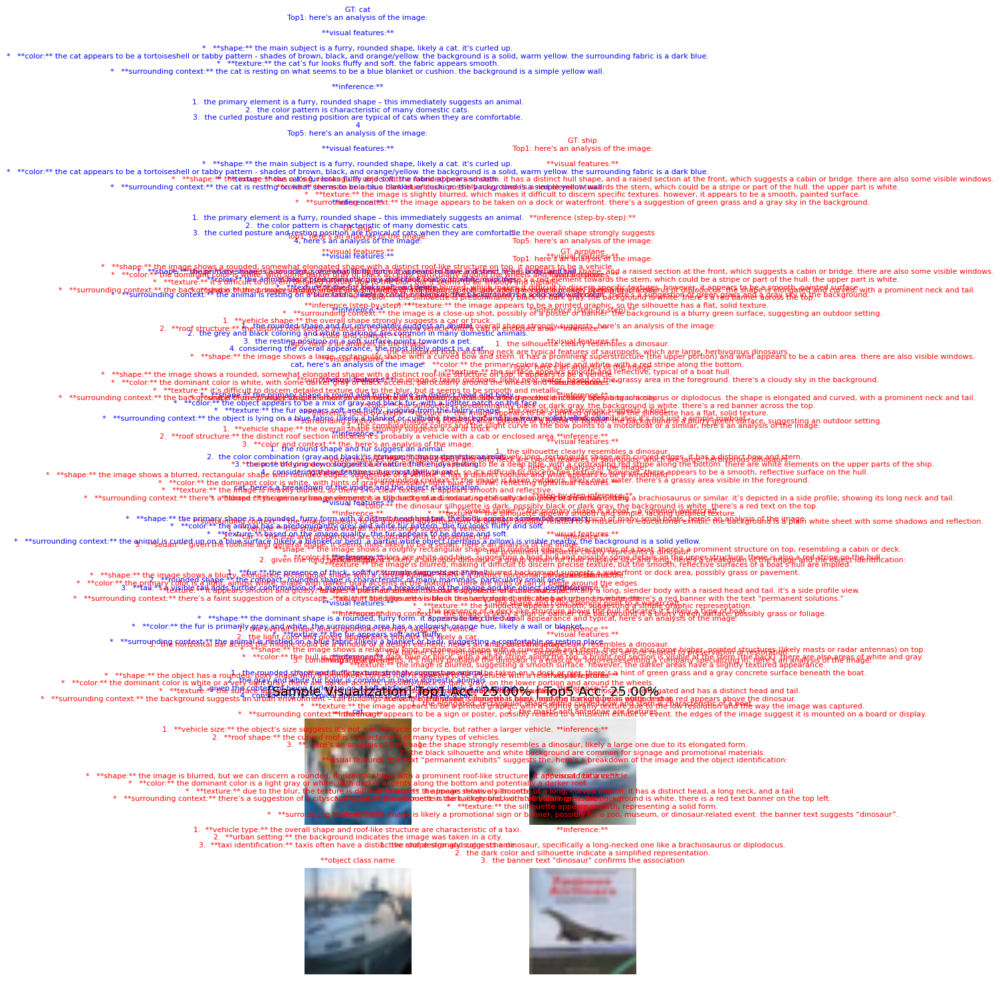


✅ Top1 Accuracy: 1/4 = 25.00%
✅ Top5 Accuracy: 1/4 = 25.00%
⏱️ Elapsed time: 24.76 sec for 4 samples


In [16]:
import re
import torch
from transformers import AutoProcessor, Gemma3ForConditionalGeneration
from torchvision.datasets import CIFAR10
from torchvision import transforms
from torch.utils.data import DataLoader, Subset
import matplotlib.pyplot as plt
from tqdm import tqdm
from time import time

# 설정
model_name = "google/gemma-3-4b-it"
batch_size = 4
n_visualize = 4  # 시각화할 샘플 수 4개
MAX_NEW_TOKENS =200
SUBSET_DATASET_SIZE = 4

# Custom collate_fn: PIL 이미지를 그대로 유지 (Tensor 변환 X)
def pil_collate_fn(batch):
    images, labels = zip(*batch)
    return list(images), list(labels)

# CIFAR‑10 로드 (transform 없이 → PIL 이미지 그대로)
data_root = "/data1/bubble3jh/data/CIFAR10"
dataset = CIFAR10(root=data_root, train=False, download=True)
# 데이터셋의 처음 100개만 사용
subset_dataset = Subset(dataset, list(range(SUBSET_DATASET_SIZE)))
dataloader = DataLoader(subset_dataset, batch_size=batch_size, shuffle=False, collate_fn=pil_collate_fn)

# PIL 이미지 resize (Gemma3는 보통 224×224 입력을 기대)
resize = transforms.Resize((224, 224))

# processor와 모델 로드 (image-text-to-text 전용)
processor = AutoProcessor.from_pretrained(model_name)
model = Gemma3ForConditionalGeneration.from_pretrained(
    model_name, torch_dtype=torch.bfloat16, device_map='auto'
)
model.eval()

def postprocess_output(raw_text):
    """
    raw_text에서 "\nmodel\n" 이후의 문자열를 추출한 후, 
    앞뒤 공백과 구두점(.,:;!? 등)을 제거합니다.
    """
    if "\nmodel\n" in raw_text:
        # "\nmodel\n" 이후의 텍스트 추출
        raw_text = raw_text.split("\nmodel\n")[-1]
    # 앞뒤 공백 및 구두점 제거
    cleaned = raw_text.strip().strip(".,:;!?")
    return cleaned.lower()

# 평가 시, 정규화 및 토큰화 함수는 그대로 사용 (필요 시 수정)
def normalize_and_tokenize(text):
    text = text.lower()
    tokens = re.split(r'[\s,/]+', text)
    tokens = [t for t in tokens if t]
    return tokens

def contains_label(pred, gt):
    tokens = normalize_and_tokenize(pred)
    return gt in tokens

def get_unique_preds_for_sample(single_conversation, initial_unique_preds, min_unique=5, max_iter=3):
    unique_preds = initial_unique_preds.copy()
    iter_count = 0
    single_input = processor.apply_chat_template(
        single_conversation,
        tokenize=True,
        return_dict=True,
        return_tensors="pt",
        add_generation_prompt=True,
        do_pan_and_scan=True
    ).to("cuda")
    
    while len(unique_preds) < min_unique and iter_count < max_iter:
        extra_outputs = model.generate(
            **single_input,
            max_new_tokens=MAX_NEW_TOKENS,
            do_sample=True,
            top_k=50,
            num_return_sequences=5,
        )
        extra_preds = processor.batch_decode(extra_outputs, skip_special_tokens=True)
        # 후처리 적용: "\nmodel\n" 이후 텍스트 추출 후 클린업
        extra_preds = [postprocess_output(pred) for pred in extra_preds]
        for pred in extra_preds:
            if pred not in unique_preds:
                unique_preds.append(pred)
                if len(unique_preds) == min_unique:
                    break
        iter_count += 1
    return unique_preds

# 평가 및 시각화를 위한 변수
correct_top1 = 0
correct_top5 = 0
total = 0
visual_data = []  # 시각화용: top1 결과와 고유한 top5 후보

start_time = time()

# 배치 처리 루프
with torch.no_grad():
    for images, labels in tqdm(dataloader, desc="Batched inference"):
        resized_images = [resize(img) for img in images]
        gt_labels = [dataset.classes[l].lower() for l in labels]

        conversations = [
            [
                {
                    "role": "user",
                    "content": [
                        {"type": "image", "image": img},
                        {"type": "text", "text": "What object is in this image? First, describe the visual features you see in the image, including shape, color, texture, and surrounding context. Then, infer what object it most likely is, step by step. Finally, output only the object class name on a new line."}
                    ]
                }
            ]
            for img in resized_images
        ]

        inputs = processor.apply_chat_template(
            conversations,
            tokenize=True,
            return_dict=True,
            return_tensors="pt",
            add_generation_prompt=True,
            do_pan_and_scan=True
        ).to("cuda")
        
        # diverse beam search 하이퍼파라미터 조정
        # outputs = model.generate(
        #     **inputs,
        #     max_new_tokens=MAX_NEW_TOKENS,
        #     num_beams=30,
        #     num_return_sequences=10,
        #     num_beam_groups=5,
        #     diversity_penalty=2.,
        #     output_scores=False,
        #     return_dict_in_generate=True,
        #     do_sample=False,
        # )
        outputs = model.generate(
            **inputs,
            max_new_tokens=MAX_NEW_TOKENS,
            do_sample=True,          # 무작위성 도입
            top_k=70,                # 상위 50개 중 무작위 선택
            temperature=0.9,         # 출력 분포의 평탄화 조절
            num_return_sequences=10,  # 다양한 결과 확보
            return_dict_in_generate=True,
        )

        
        decoded_outputs = processor.batch_decode(outputs.sequences, skip_special_tokens=True)
        
        for i in range(len(labels)):
            beam_outputs = decoded_outputs[i*10:(i+1)*10]
            # 후처리: "\nmodel\n" 이후의 텍스트 추출 및 클린업
            beam_outputs = [postprocess_output(b) for b in beam_outputs]
            
            unique_preds = []
            for pred in beam_outputs:
                if pred not in unique_preds:
                    unique_preds.append(pred)
                if len(unique_preds) == 5:
                    break
            
            if len(unique_preds) < 5:
                unique_preds = get_unique_preds_for_sample(conversations[i], unique_preds, min_unique=5, max_iter=3)
            
            top1_pred = unique_preds[0] if unique_preds else ""
            is_top1_correct = contains_label(top1_pred, gt_labels[i])
            if is_top1_correct:
                correct_top1 += 1
            
            is_top5_correct = any(contains_label(pred, gt_labels[i]) for pred in unique_preds)
            if is_top5_correct:
                correct_top5 += 1
            
            if total < n_visualize:
                visual_data.append((resized_images[i], gt_labels[i], unique_preds, is_top1_correct, is_top5_correct))
            total += 1

torch.cuda.empty_cache()
elapsed = time() - start_time

fig, axes = plt.subplots(2, n_visualize // 2, figsize=(8, 5), gridspec_kw={'hspace': 0.4})  # row 간 여백 추가
for idx, (image, gt, unique_preds, is_top1_correct, is_top5_correct) in enumerate(visual_data):
    ax = axes[idx // (n_visualize // 2)][idx % (n_visualize // 2)]
    ax.imshow(image)
    ax.axis("off")
    title_text = f"GT: {gt}\nTop1: {unique_preds[0] if unique_preds else 'N/A'}\nTop5: {', '.join(unique_preds)}"

    if is_top1_correct:
        color = "blue"
    elif is_top5_correct:
        color = "green"
    else:
        color = "red"

    ax.set_title(title_text, fontsize=8, color=color)



plt.suptitle(f"[Sample Visualization] Top1 Acc: {correct_top1 / total * 100:.2f}% | Top5 Acc: {correct_top5 / total * 100:.2f}%", fontsize=14)
plt.tight_layout()
plt.show()

print(f"\n✅ Top1 Accuracy: {correct_top1}/{total} = {correct_top1 / total * 100:.2f}%")
print(f"✅ Top5 Accuracy: {correct_top5}/{total} = {correct_top5 / total * 100:.2f}%")
print(f"⏱️ Elapsed time: {elapsed:.2f} sec for {total} samples")


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Batched inference: 100%|██████████| 1/1 [00:22<00:00, 22.53s/it]
/tmp/ipykernel_423038/1146826081.py:215: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


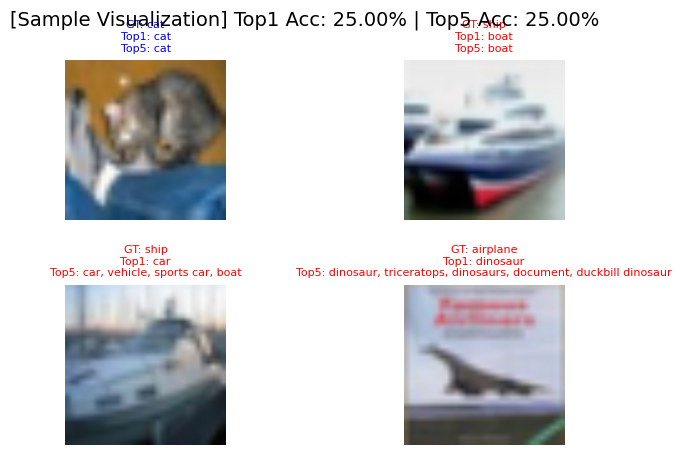


✅ Top1 Accuracy: 1/4 = 25.00%
✅ Top5 Accuracy: 1/4 = 25.00%
⏱️ Elapsed time: 22.57 sec for 4 samples


[(<PIL.Image.Image image mode=RGB size=224x224>, 'cat', ['cat'], True, True),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'ship',
  ['boat'],
  False,
  False),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'ship',
  ['car', 'vehicle', 'sports car', 'boat'],
  False,
  False),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'airplane',
  ['dinosaur', 'triceratops', 'dinosaurs', 'document', 'duckbill dinosaur'],
  False,
  False)]

In [35]:

model_name = "google/gemma-3-4b-it"
batch_size = 4
n_visualize = 4  # 시각화할 샘플 수 4개
MAX_NEW_TOKENS =200
SUBSET_DATASET_SIZE = 4
input_prompt = "What object is in this image? Please answer only the class name"
topk = 100
temperature = 1.2
result = eval_gemma(model_name, batch_size, n_visualize, MAX_NEW_TOKENS, SUBSET_DATASET_SIZE, input_prompt, topk, temperature)
result

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Batched inference: 100%|██████████| 1/1 [00:16<00:00, 16.12s/it]
/tmp/ipykernel_423038/1146826081.py:215: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


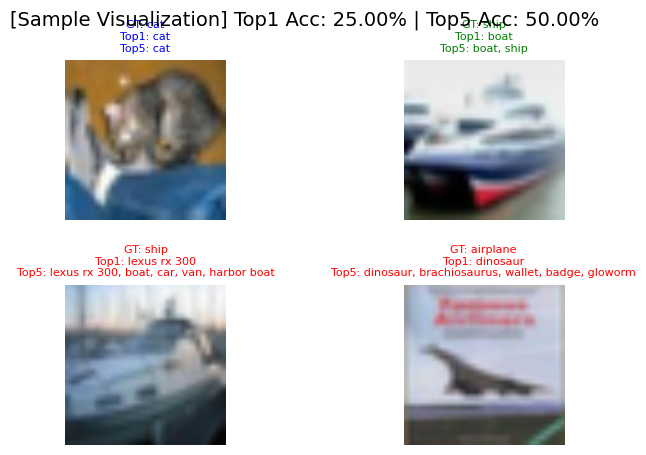


✅ Top1 Accuracy: 1/4 = 25.00%
✅ Top5 Accuracy: 2/4 = 50.00%
⏱️ Elapsed time: 16.17 sec for 4 samples


[(<PIL.Image.Image image mode=RGB size=224x224>, 'cat', ['cat'], True, True),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'ship',
  ['boat', 'ship'],
  False,
  True),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'ship',
  ['lexus rx 300', 'boat', 'car', 'van', 'harbor boat'],
  False,
  False),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'airplane',
  ['dinosaur', 'brachiosaurus', 'wallet', 'badge', 'gloworm'],
  False,
  False)]

In [36]:

model_name = "google/gemma-3-4b-it"
batch_size = 4
n_visualize = 4  # 시각화할 샘플 수 4개
MAX_NEW_TOKENS =200
SUBSET_DATASET_SIZE = 4
input_prompt = "What object is in this image? Please answer only the class name"
topk = 100
temperature = 2.5
result = eval_gemma(model_name, batch_size, n_visualize, MAX_NEW_TOKENS, SUBSET_DATASET_SIZE, input_prompt, topk, temperature)
result

## Differ Models


Loading checkpoint shards:   0%|          | 0/5 [00:00<?, ?it/s]

Batched inference: 100%|██████████| 5/5 [06:13<00:00, 74.62s/it]
/tmp/ipykernel_1708007/3852471333.py:192: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


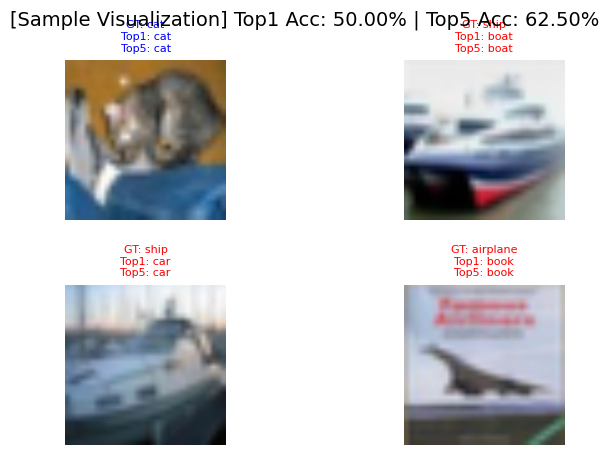


✅ Top1 Accuracy: 20/40 = 50.00%
✅ Top5 Accuracy: 25/40 = 62.50%
⏱️ Elapsed time: 373.18 sec for 40 samples


[(<PIL.Image.Image image mode=RGB size=224x224>, 'cat', ['cat'], True, True),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'ship',
  ['boat'],
  False,
  False),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'ship',
  ['car'],
  False,
  False),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'airplane',
  ['book'],
  False,
  False)]

In [22]:

model_name = "google/gemma-3-12b-it"
batch_size = 8
n_visualize = 4  # 시각화할 샘플 수 4개
MAX_NEW_TOKENS =200
SUBSET_DATASET_SIZE = 40
input_prompt = "What object is in this image? Please answer only the class name"
topk = 100
temperature = 1.
result = eval_gemma(model_name, batch_size, n_visualize, MAX_NEW_TOKENS, SUBSET_DATASET_SIZE, input_prompt, topk, temperature)
result

## Differ Prompts

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Batched inference: 100%|██████████| 5/5 [05:39<00:00, 67.91s/it]
/tmp/ipykernel_1708007/3852471333.py:192: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


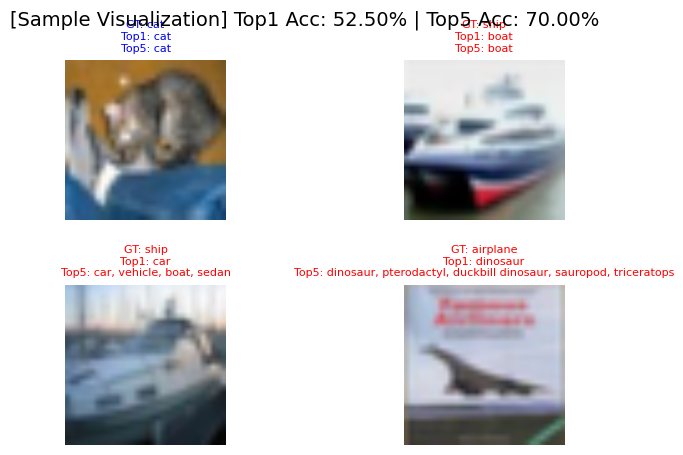


✅ Top1 Accuracy: 21/40 = 52.50%
✅ Top5 Accuracy: 28/40 = 70.00%
⏱️ Elapsed time: 339.60 sec for 40 samples


[(<PIL.Image.Image image mode=RGB size=224x224>, 'cat', ['cat'], True, True),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'ship',
  ['boat'],
  False,
  False),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'ship',
  ['car', 'vehicle', 'boat', 'sedan'],
  False,
  False),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'airplane',
  ['dinosaur', 'pterodactyl', 'duckbill dinosaur', 'sauropod', 'triceratops'],
  False,
  False)]

In [17]:

model_name = "google/gemma-3-4b-it"
batch_size = 8
n_visualize = 4  # 시각화할 샘플 수 4개
MAX_NEW_TOKENS =200
SUBSET_DATASET_SIZE = 40
input_prompt = "What object is in this image? Please answer only the class name"
topk = 100
temperature = 1.
result = eval_gemma(model_name, batch_size, n_visualize, MAX_NEW_TOKENS, SUBSET_DATASET_SIZE, input_prompt, topk, temperature)
result

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Batched inference: 100%|██████████| 5/5 [03:31<00:00, 42.30s/it]
/tmp/ipykernel_1708007/3852471333.py:192: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


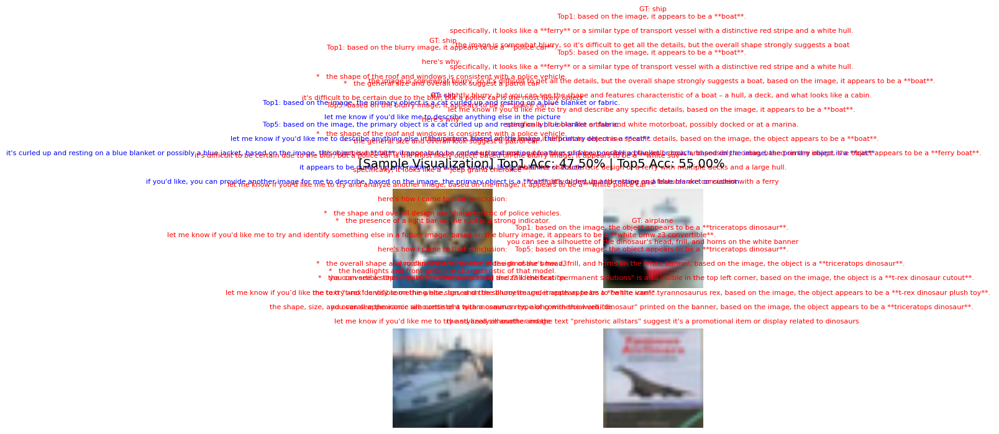


✅ Top1 Accuracy: 19/40 = 47.50%
✅ Top5 Accuracy: 22/40 = 55.00%
⏱️ Elapsed time: 211.57 sec for 40 samples


[(<PIL.Image.Image image mode=RGB size=224x224>,
  'cat',
  ["based on the image, the primary object is a cat curled up and resting on a blue blanket or fabric. \n\nlet me know if you'd like me to describe anything else in the picture",
   "based on the image, the primary object is a **cat**. \n\nit's curled up and resting on a blue blanket or possibly a blue jacket",
   'based on the image, the object is a **cat**. it appears to be curled up and resting on a blue surface, possibly a blanket or couch',
   "based on the image, the primary object is a **cat**. \n\nit appears to be curled up and resting on a blue surface, likely a blanket or couch. \n\nif you'd like, you can provide another image for me to describe",
   "based on the image, the primary object is a **cat**. it's curled up and resting on a blue blanket or cushion"],
  True,
  True),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'ship',
  ["based on the image, it appears to be a **boat**. \n\nspecifically, it looks like

In [16]:

model_name = "google/gemma-3-4b-it"
batch_size = 8
n_visualize = 4  # 시각화할 샘플 수 4개
MAX_NEW_TOKENS =200
SUBSET_DATASET_SIZE = 40
input_prompt = "What object is in this image?"
topk = 100
temperature = 1.
result = eval_gemma(model_name, batch_size, n_visualize, MAX_NEW_TOKENS, SUBSET_DATASET_SIZE, input_prompt, topk, temperature)
result

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Batched inference: 100%|██████████| 5/5 [03:41<00:00, 44.26s/it]
/tmp/ipykernel_1708007/3852471333.py:192: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


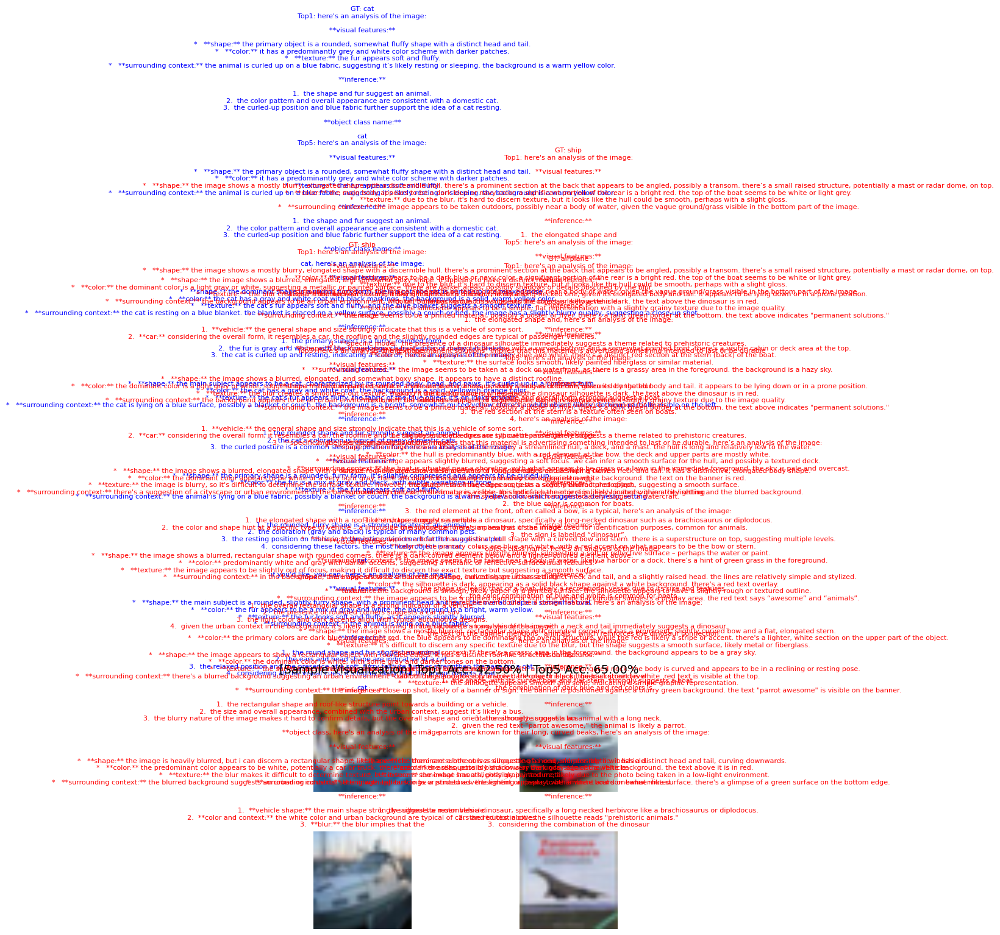


✅ Top1 Accuracy: 17/40 = 42.50%
✅ Top5 Accuracy: 26/40 = 65.00%
⏱️ Elapsed time: 221.38 sec for 40 samples


[(<PIL.Image.Image image mode=RGB size=224x224>,
  'cat',
  ["here's an analysis of the image:\n\n**visual features:**\n\n*   **shape:** the primary object is a rounded, somewhat fluffy shape with a distinct head and tail.\n*   **color:** it has a predominantly grey and white color scheme with darker patches.\n*   **texture:** the fur appears soft and fluffy.\n*   **surrounding context:** the animal is curled up on a blue fabric, suggesting it’s likely resting or sleeping. the background is a warm yellow color.\n\n**inference:**\n\n1.  the shape and fur suggest an animal.\n2.  the color pattern and overall appearance are consistent with a domestic cat.\n3.  the curled-up position and blue fabric further support the idea of a cat resting.\n\n**object class name:**\n\ncat",
   "here's an analysis of the image:\n\n**visual features:**\n\n*   **shape:** the dominant shape is a round, furry form, likely a cat. the cat is curled up in a relaxed pose.\n*   **color:** the cat has a gray and wh

In [18]:

model_name = "google/gemma-3-4b-it"
batch_size = 8
n_visualize = 4  # 시각화할 샘플 수 4개
MAX_NEW_TOKENS =200
SUBSET_DATASET_SIZE = 40
input_prompt = "What object is in this image? What object is in this image? First, describe the visual features you see in the image, including shape, color, texture, and surrounding context. Then, infer what object it most likely is, step by step. Finally, output only the object class name on a new line."
topk = 100
temperature = 1.
result = eval_gemma(model_name, batch_size, n_visualize, MAX_NEW_TOKENS, SUBSET_DATASET_SIZE, input_prompt, topk, temperature)
result

## Differ temperature

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Batched inference: 100%|██████████| 5/5 [03:20<00:00, 40.02s/it]
/tmp/ipykernel_1708007/3852471333.py:192: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


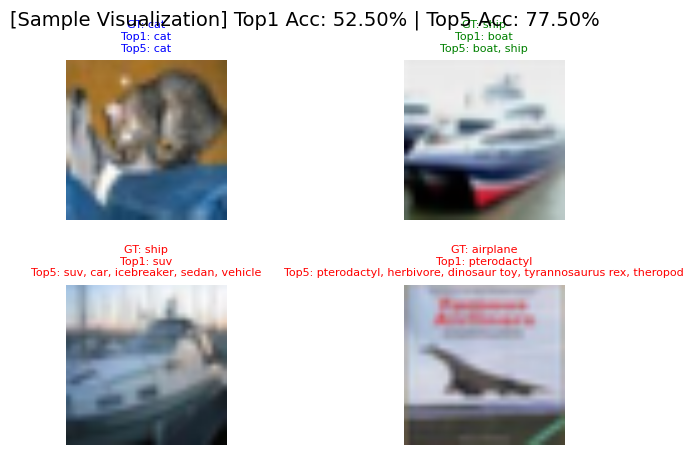


✅ Top1 Accuracy: 21/40 = 52.50%
✅ Top5 Accuracy: 31/40 = 77.50%
⏱️ Elapsed time: 200.16 sec for 40 samples


[(<PIL.Image.Image image mode=RGB size=224x224>, 'cat', ['cat'], True, True),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'ship',
  ['boat', 'ship'],
  False,
  True),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'ship',
  ['suv', 'car', 'icebreaker', 'sedan', 'vehicle'],
  False,
  False),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'airplane',
  ['pterodactyl',
   'herbivore',
   'dinosaur toy',
   'tyrannosaurus rex',
   'theropod'],
  False,
  False)]

In [19]:

model_name = "google/gemma-3-4b-it"
batch_size = 8
n_visualize = 4  # 시각화할 샘플 수 4개
MAX_NEW_TOKENS =200
SUBSET_DATASET_SIZE = 40
input_prompt = "What object is in this image? Please answer only the class name"
topk = 100
temperature = 2.
result = eval_gemma(model_name, batch_size, n_visualize, MAX_NEW_TOKENS, SUBSET_DATASET_SIZE, input_prompt, topk, temperature)
result

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Batched inference: 100%|██████████| 5/5 [02:58<00:00, 35.72s/it]
/tmp/ipykernel_1708007/3852471333.py:192: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/data1/bubble3jh/anaconda/envs/coe/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128054 (\N{DOG FACE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


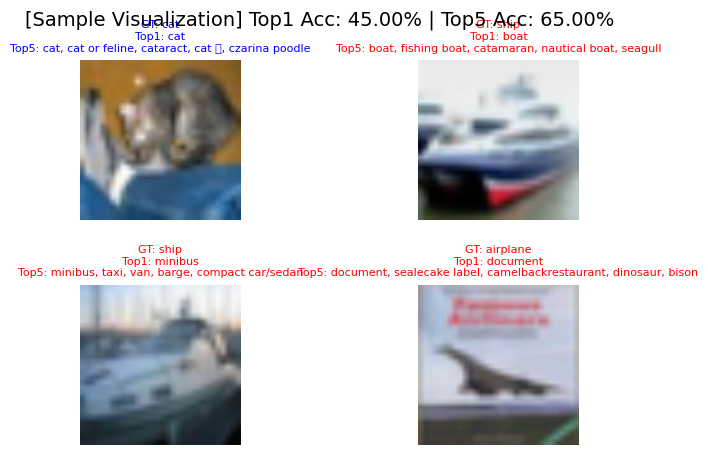


✅ Top1 Accuracy: 18/40 = 45.00%
✅ Top5 Accuracy: 26/40 = 65.00%
⏱️ Elapsed time: 178.67 sec for 40 samples


[(<PIL.Image.Image image mode=RGB size=224x224>,
  'cat',
  ['cat', 'cat or feline', 'cataract', 'cat 🐶', 'czarina \u200b\u200bpoodle'],
  True,
  True),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'ship',
  ['boat', 'fishing boat', 'catamaran', 'nautical boat', 'seagull'],
  False,
  False),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'ship',
  ['minibus', 'taxi', 'van', 'barge', 'compact car/sedan'],
  False,
  False),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'airplane',
  ['document', 'sealecake label', 'camelbackrestaurant', 'dinosaur', 'bison'],
  False,
  False)]

In [20]:

model_name = "google/gemma-3-4b-it"
batch_size = 8
n_visualize = 4  # 시각화할 샘플 수 4개
MAX_NEW_TOKENS =200
SUBSET_DATASET_SIZE = 40
input_prompt = "What object is in this image? Please answer only the class name"
topk = 100
temperature = 3.
result = eval_gemma(model_name, batch_size, n_visualize, MAX_NEW_TOKENS, SUBSET_DATASET_SIZE, input_prompt, topk, temperature)
result

In [21]:

model_name = "google/gemma-3-4b-it"
batch_size = 8
n_visualize = 4  # 시각화할 샘플 수 4개
MAX_NEW_TOKENS =200
SUBSET_DATASET_SIZE = 40
input_prompt = "What object is in this image? Please answer only the class name"
topk = 100
temperature = 5.
result = eval_gemma(model_name, batch_size, n_visualize, MAX_NEW_TOKENS, SUBSET_DATASET_SIZE, input_prompt, topk, temperature)
result

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Batched inference: 100%|██████████| 5/5 [03:29<00:00, 41.94s/it]
/tmp/ipykernel_1708007/3852471333.py:192: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


ValueError: 
Top5: light yacht, fargo‍³⁺​gondola taxi prototype​​¹‍͡¹/∘‍♂️1⁶⁸8$$¹⁄
                                                                 ^
ParseException: Expected end of text, found '$'  (at char 65), (line:1, col:66)

<Figure size 800x500 with 4 Axes>


✅ Top1 Accuracy: 8/40 = 20.00%
✅ Top5 Accuracy: 25/40 = 62.50%
⏱️ Elapsed time: 209.75 sec for 40 samples


[(<PIL.Image.Image image mode=RGB size=224x224>,
  'cat',
  ['gatsby masking card, photographic printing\xa0/ photography/ photographic series',
   'cat body - background photo portrait is one object recognizable using imagenet label guidelines',
   'kitten cat',
   'hog ring4_f3ly  4a8s\u200b qjfm',
   'cat drawing'],
  False,
  True),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'ship',
  ['shipping cruise',
   'maritime survey launch',
   'bus',
   'boatshull',
   'boatrefugiox8wjsdr3kwp2rauelqfrvokzk1j7n5tdswrw\n4r0p4ymggsgszeguf0qoaehsrv5gxn.jpuoea8g'],
  False,
  False),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'ship',
  ['light yacht',
   'fargo\u200d³⁺\u200bgondola taxi prototype\u200b\u200b¹\u200d͡¹/∘\u200d♂️1⁶⁸8$$¹⁄\n\n⁴²℺4?$\\text\u200c±$$\\ⴙ-₂ ���$\\bl\n*⁹⁶?–8°$$',
   'ferry',
   'vehicle study iii',
   'motor boat'],
  False,
  False),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'airplane',
  ['carrot.cardinaliausp',
   'spenseen appliance',
   'docu

## Appendix differ model w/ differ temp (2.0)

Loading checkpoint shards:   0%|          | 0/5 [00:00<?, ?it/s]

Batched inference: 100%|██████████| 5/5 [07:41<00:00, 92.36s/it] 
/tmp/ipykernel_1708007/3852471333.py:192: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


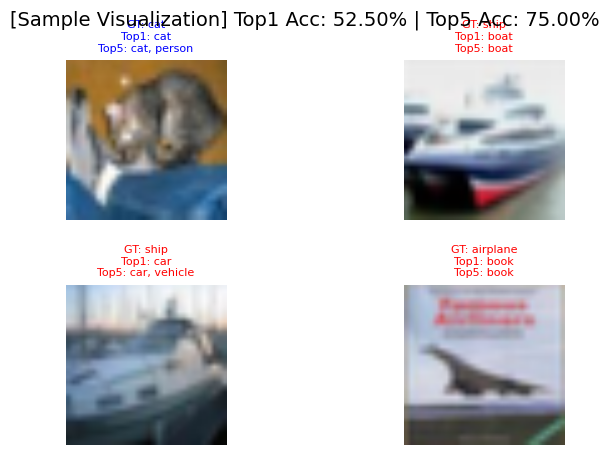


✅ Top1 Accuracy: 21/40 = 52.50%
✅ Top5 Accuracy: 30/40 = 75.00%
⏱️ Elapsed time: 461.89 sec for 40 samples


[(<PIL.Image.Image image mode=RGB size=224x224>,
  'cat',
  ['cat', 'person'],
  True,
  True),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'ship',
  ['boat'],
  False,
  False),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'ship',
  ['car', 'vehicle'],
  False,
  False),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'airplane',
  ['book'],
  False,
  False)]

In [23]:

model_name = "google/gemma-3-12b-it"
batch_size = 8
n_visualize = 4  # 시각화할 샘플 수 4개
MAX_NEW_TOKENS =200
SUBSET_DATASET_SIZE = 40
input_prompt = "What object is in this image? Please answer only the class name"
topk = 100
temperature = 2.
result = eval_gemma(model_name, batch_size, n_visualize, MAX_NEW_TOKENS, SUBSET_DATASET_SIZE, input_prompt, topk, temperature)
result

Loading checkpoint shards:   0%|          | 0/5 [00:00<?, ?it/s]

Batched inference: 100%|██████████| 5/5 [09:17<00:00, 111.53s/it]
/tmp/ipykernel_1708007/3852471333.py:192: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


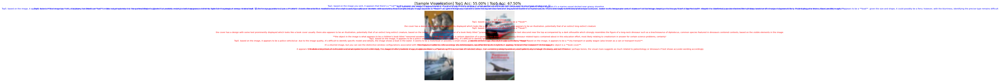


✅ Top1 Accuracy: 22/40 = 55.00%
✅ Top5 Accuracy: 27/40 = 67.50%
⏱️ Elapsed time: 557.72 sec for 40 samples


[(<PIL.Image.Image image mode=RGB size=224x224>,
  'cat',
  ["based on the image you sent, it appears that there's a **cat** in this image! you seem to have a headshot of a blurred cat partially resting on what appears to either be light fabric against an ornage shaded wall. 🐱",
   'the image appears to show a **turtle**. it looks like a turtle is nestled onto a blue object, possibly a pillow or blanket, with mustard yellow background',
   "the image appears to show a cat.  given the grainy resolution;  determining an exact breed or any special markers isn't practical, but that's seemingly definitively what exists to inspect",
   'based on the image you sent, it shows a *cat curled up sleeping on a blue surface*. it appears to be relaxed in a comfortable position behind the curtains',
   'based on the image, it appears to be a **cat laying on a blue surface, possibly a sofa.**'],
  True,
  True),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'ship',
  ["based on the image, it appe

In [24]:

model_name = "google/gemma-3-12b-it"
batch_size = 8
n_visualize = 4  # 시각화할 샘플 수 4개
MAX_NEW_TOKENS =200
SUBSET_DATASET_SIZE = 40
input_prompt = "What object is in this image?"
topk = 100
temperature = 2.
result = eval_gemma(model_name, batch_size, n_visualize, MAX_NEW_TOKENS, SUBSET_DATASET_SIZE, input_prompt, topk, temperature)
result

Loading checkpoint shards:   0%|          | 0/5 [00:00<?, ?it/s]

Batched inference: 100%|██████████| 5/5 [13:02<00:00, 156.44s/it]
/tmp/ipykernel_1708007/3852471333.py:192: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


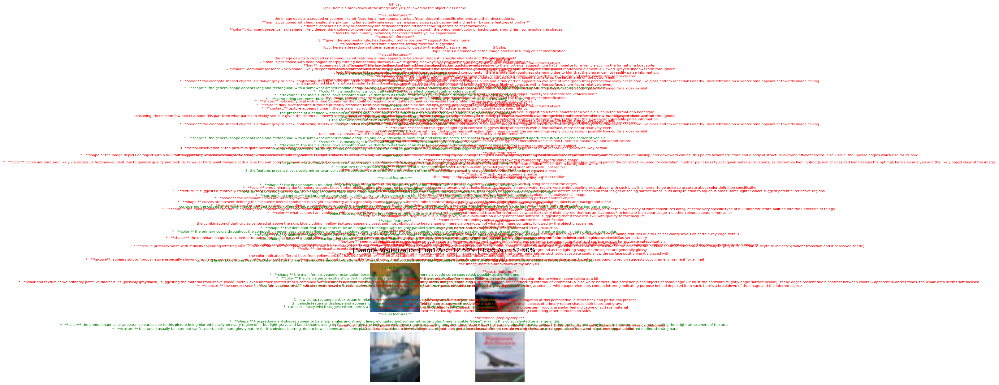


✅ Top1 Accuracy: 5/40 = 12.50%
✅ Top5 Accuracy: 21/40 = 52.50%
⏱️ Elapsed time: 782.32 sec for 40 samples


[(<PIL.Image.Image image mode=RGB size=224x224>,
  'cat',
  ["here's a breakdown of the image analysis, followed by the object class name:\n\n**visual features:**\nthe image depicts a cropped or zoomed-in shot featuring a man (appears to be african descent). specific elements and their description is.\n- **man is positioned with head angled sharply turning horizontally sideways - we're gazing sideways/sideview behind he hair by some features of profile.**\n- **hair**: appears as bushy or potentially braided/wadded behind head showing darker color (brown/black).\n- **color**: dominant presence - skin shade, likely deeper dark-colored or tone (but resolution is quite poor; indistinct), the predominant color or background around him; some golden. in shades\nit feels blurred in many instances; background hints yellow appearance \n**steps of inference:**\n1, **given the sidehead-angle, head position profile position.** suggest the likely human\n2, it's positioned like this within broader se

In [25]:

model_name = "google/gemma-3-12b-it"
batch_size = 8
n_visualize = 4  # 시각화할 샘플 수 4개
MAX_NEW_TOKENS =200
SUBSET_DATASET_SIZE = 40
input_prompt = "What object is in this image? What object is in this image? First, describe the visual features you see in the image, including shape, color, texture, and surrounding context. Then, infer what object it most likely is, step by step. Finally, output only the object class name on a new line."
topk = 100
temperature = 2.
result = eval_gemma(model_name, batch_size, n_visualize, MAX_NEW_TOKENS, SUBSET_DATASET_SIZE, input_prompt, topk, temperature)
result

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Batched inference: 100%|██████████| 5/5 [07:20<00:00, 88.19s/it]
/tmp/ipykernel_1708007/3852471333.py:192: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


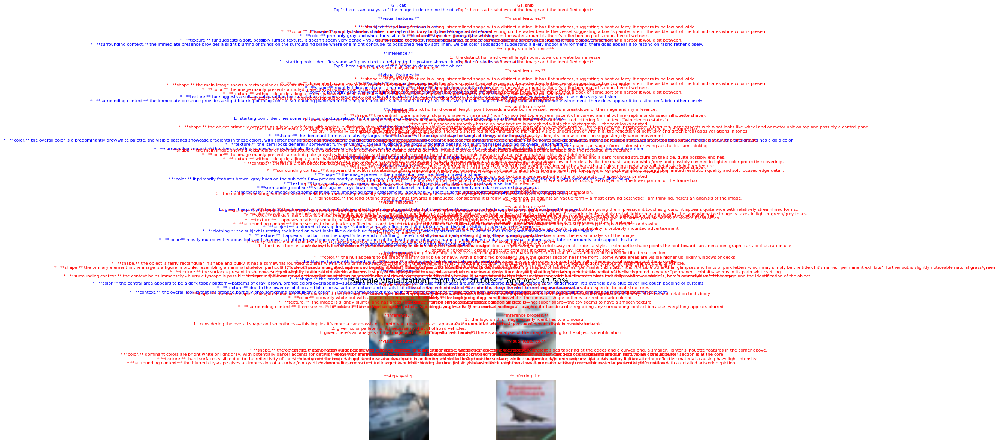


✅ Top1 Accuracy: 8/40 = 20.00%
✅ Top5 Accuracy: 19/40 = 47.50%
⏱️ Elapsed time: 441.01 sec for 40 samples


[(<PIL.Image.Image image mode=RGB size=224x224>,
  'cat',
  ["here's an analysis of the image to determine the object:\n\n**visual features:**\n\n*   **subject:** the image shows a cat.\n*   **shape:** roughly feline in shape – characteristic furry body and elongated face/ears.\n*   **color:** primarily gray and white fur visible. a hint of pinkish visible through the whiskers.\n*   **texture:** fur suggests a soft, possibly ruffled texture, it doesn’t seem very dense – you do not realize the full surface appearance. the face surface appears somewhat pale and it resembles very soft skin.\n*   **surrounding context:** the immediate presence provides a slight blurring of things on the surrounding plane where one might conclude its positioned nearby soft linen. we get color suggestion suggesting a likely indoor environment. there does appear it to resting on fabric rather closely.   \n\n**inference:** \n\n1.  starting point identifies some soft plush texture related to the posture shown c

In [27]:

model_name = "google/gemma-3-4b-it"
batch_size = 8
n_visualize = 4  # 시각화할 샘플 수 4개
MAX_NEW_TOKENS =200
SUBSET_DATASET_SIZE = 40
input_prompt = "What object is in this image? First, describe the visual features you see in the image, including shape, color, texture, and surrounding context. Then, infer what object it most likely is, step by step. Finally, output only the object class name on a new line."
topk = 100
temperature = 2.
result = eval_gemma(model_name, batch_size, n_visualize, MAX_NEW_TOKENS, SUBSET_DATASET_SIZE, input_prompt, topk, temperature)
result

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Batched inference: 100%|██████████| 5/5 [04:50<00:00, 58.15s/it]
/tmp/ipykernel_1708007/3852471333.py:192: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


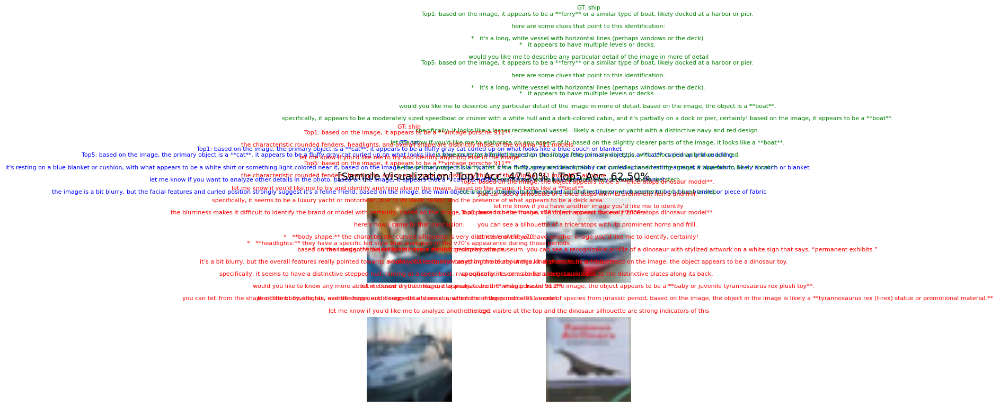


✅ Top1 Accuracy: 19/40 = 47.50%
✅ Top5 Accuracy: 25/40 = 62.50%
⏱️ Elapsed time: 290.82 sec for 40 samples


[(<PIL.Image.Image image mode=RGB size=224x224>,
  'cat',
  ['based on the image, the primary object is a **cat**. it appears to be a fluffy gray cat curled up on what looks like a blue couch or blanket',
   "based on the image, the primary object is a **cat** curled up and cuddling. \n\nit's resting on a blue blanket or cushion, with what appears to be a white shirt or something light-colored near it",
   "based on the image, the primary object is a **cat**. it's a fluffy, grey and black tabby cat curled up and resting against a blue fabric, likely a couch or blanket. \n\nlet me know if you want to analyze other details in the photo",
   "based on the image, it appears that a **cat** is nestled comfortably on a blue surface, likely a couch or blanket. \n\nthe image is a bit blurry, but the facial features and curled position strongly suggest it's a feline friend",
   'based on the image, the main object is a cat. it appears to be curled up and resting on what seems to be a blue blanke

In [28]:

model_name = "google/gemma-3-4b-it"
batch_size = 8
n_visualize = 4  # 시각화할 샘플 수 4개
MAX_NEW_TOKENS =200
SUBSET_DATASET_SIZE = 40
input_prompt = "What object is in this image?"
topk = 100
temperature = 2.
result = eval_gemma(model_name, batch_size, n_visualize, MAX_NEW_TOKENS, SUBSET_DATASET_SIZE, input_prompt, topk, temperature)
result

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Batched inference: 100%|██████████| 1/1 [00:15<00:00, 15.88s/it]
/tmp/ipykernel_423038/1146826081.py:215: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


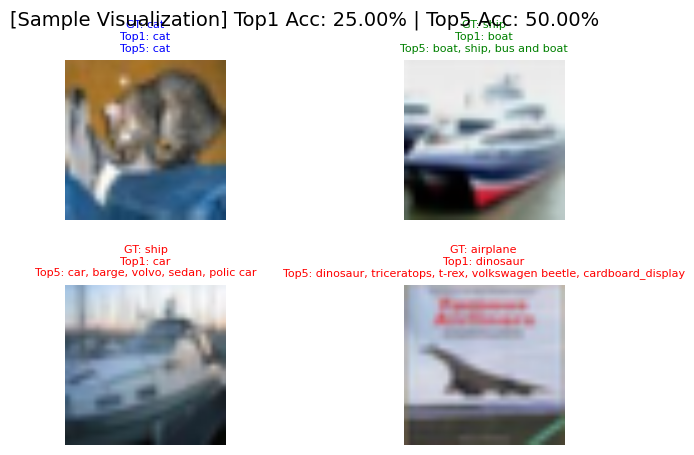


✅ Top1 Accuracy: 1/4 = 25.00%
✅ Top5 Accuracy: 2/4 = 50.00%
⏱️ Elapsed time: 15.95 sec for 4 samples


[(<PIL.Image.Image image mode=RGB size=224x224>, 'cat', ['cat'], True, True),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'ship',
  ['boat', 'ship', 'bus and boat'],
  False,
  True),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'ship',
  ['car', 'barge', 'volvo', 'sedan', 'polic car'],
  False,
  False),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'airplane',
  ['dinosaur',
   'triceratops',
   't-rex',
   'volkswagen beetle',
   'cardboard_display'],
  False,
  False)]

In [37]:

model_name = "google/gemma-3-4b-it"
batch_size = 4
n_visualize = 4  # 시각화할 샘플 수 4개
MAX_NEW_TOKENS =200
SUBSET_DATASET_SIZE = 4
input_prompt = "What object is in this image? Please answer only the class name"
topk = 100
temperature = 2.5
result = eval_gemma(model_name, batch_size, n_visualize, MAX_NEW_TOKENS, SUBSET_DATASET_SIZE, input_prompt, topk, temperature)
result

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Batched inference: 100%|██████████| 38/38 [20:01<00:00, 31.61s/it]
/tmp/ipykernel_423038/4069793721.py:221: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


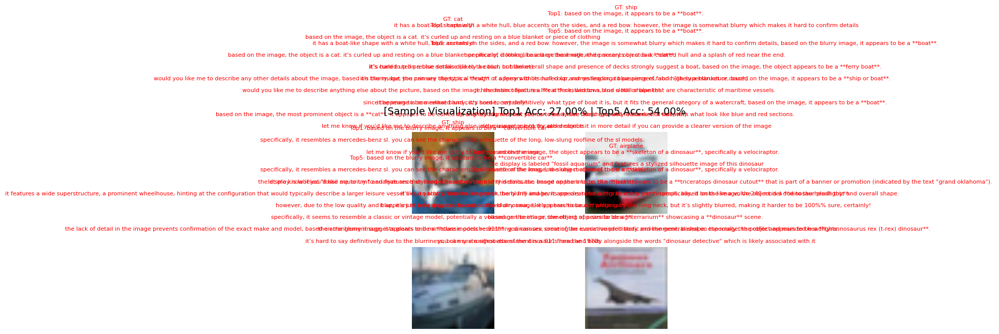


✅ Top1 Accuracy: 81/300 = 27.00%
✅ Top5 Accuracy: 162/300 = 54.00%
⏱️ Elapsed time: 1201.11 sec for 300 samples


[(<PIL.Image.Image image mode=RGB size=224x224>,
  'cat',
  ["certainly! \n\nbased on the image, the object is a cat. it's curled up and resting on a blue blanket or piece of clothing",
   "based on the image, the primary object is a **cat**. \n\nit's curled up on a blue surface (likely a couch or blanket). \n\nwould you like me to describe any other details about the image",
   'based on the image, the primary object is a **cat**. it appears to be curled up and resting on a blue piece of fabric (likely a blanket or couch). \n\nwould you like me to describe anything else about the picture',
   'based on the image, the main object is a **cat** nestled on a blue cloth or blanket. \n\nit appears to be a relaxed and cozy scene',
   "certainly! \n\nbased on the image, the most prominent object is a **cat**. it appears to be curled up and resting on what seems to be a blue fabric (possibly a blanket or sweater). \n\nlet me know if you'd like me to describe anything else in the image or look 

In [47]:

model_name = "google/gemma-3-4b-it"
batch_size = 8
n_visualize = 4  # 시각화할 샘플 수 4개
MAX_NEW_TOKENS =200
SUBSET_DATASET_SIZE = 300
input_prompt = "What object is in this image? "
topk = 100
temperature = 2.
result = eval_gemma(model_name, batch_size, n_visualize, MAX_NEW_TOKENS, SUBSET_DATASET_SIZE, input_prompt, topk, temperature)
result

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Batched inference: 100%|██████████| 1/1 [00:16<00:00, 16.90s/it]
/tmp/ipykernel_423038/4069793721.py:221: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/data1/bubble3jh/anaconda/envs/coe/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128663 (\N{AUTOMOBILE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


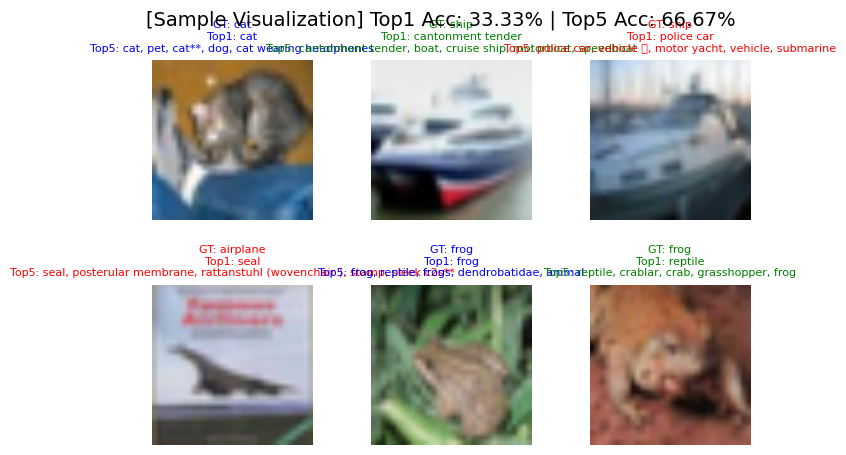


✅ Top1 Accuracy: 2/6 = 33.33%
✅ Top5 Accuracy: 4/6 = 66.67%
⏱️ Elapsed time: 16.95 sec for 6 samples


[(<PIL.Image.Image image mode=RGB size=224x224>,
  'cat',
  ['cat', 'pet', 'cat**', 'dog', 'cat wearing headphones'],
  True,
  True),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'ship',
  ['cantonment tender', 'boat', 'cruise ship', 'motorboat', 'speedboat'],
  False,
  True),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'ship',
  ['police car', 'vehicle 🚗', 'motor yacht', 'vehicle', 'submarine'],
  False,
  False),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'airplane',
  ['seal',
   'posterular membrane',
   'rattanstuhl (wovenchair )',
   'stamp',
   'sleek c2s**'],
  False,
  False),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'frog',
  ['frog', 'reptile', 'frogs', 'dendrobatidae', 'animal'],
  True,
  True),
 (<PIL.Image.Image image mode=RGB size=224x224>,
  'frog',
  ['reptile', 'crablar', 'crab', 'grasshopper', 'frog'],
  False,
  True)]

In [44]:

model_name = "google/gemma-3-4b-it"
batch_size = 6
n_visualize = 6  # 시각화할 샘플 수 4개
MAX_NEW_TOKENS =200
SUBSET_DATASET_SIZE = 6
input_prompt = "What object is in this image? Please answer only the class name"
topk = 100
temperature = 3.
result = eval_gemma(model_name, batch_size, n_visualize, MAX_NEW_TOKENS, SUBSET_DATASET_SIZE, input_prompt, topk, temperature)
result

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Batched inference: 100%|██████████| 1/1 [00:24<00:00, 24.68s/it]
/tmp/ipykernel_423038/1146826081.py:215: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


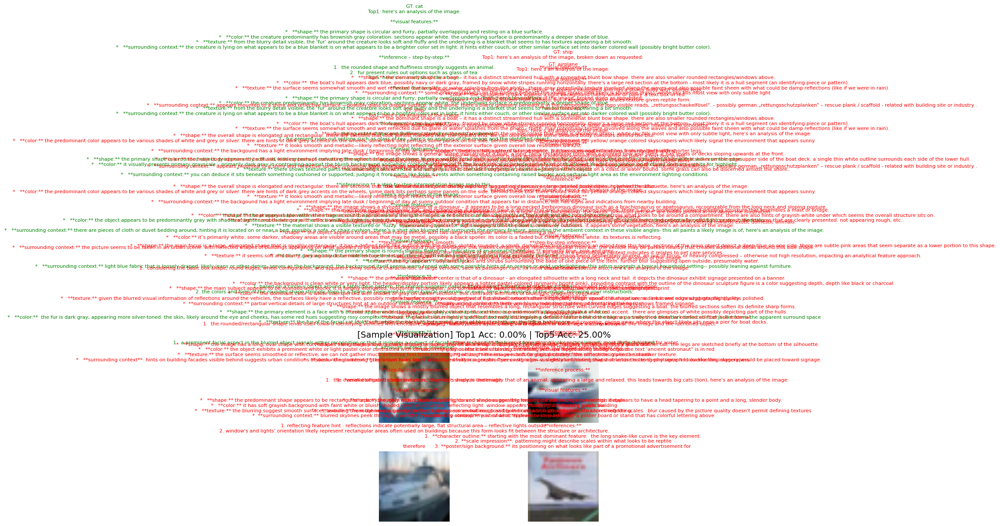


✅ Top1 Accuracy: 0/4 = 0.00%
✅ Top5 Accuracy: 1/4 = 25.00%
⏱️ Elapsed time: 24.71 sec for 4 samples


[(<PIL.Image.Image image mode=RGB size=224x224>,
  'cat',
  ["here's an analysis of the image:\n\n**visual features:**\n\n*   **shape:** the primary shape is circular and furry, partially overlapping and resting on a blue surface.\n*   **color:** the creature predominantly has brownish gray coloration. sections appear white. the underlying surface is predominantly a deeper shade of blue.\n*   **texture:** from the blurry detail visible, the ‘fur’ around the creature looks soft and fluffy and the underlying is a blanket that seems to has textures appearing a bit smooth.\n*   **surrounding context:** the creature is lying on what appears to be a blue blanket is on what appears to be a brighter color set in light. it hints either couch, or other similar surface set into darker colored wall (possibly bright butter color). \n\n**inference – step-by-step:**\n\n1.  the rounded shape and fluffiness strongly suggests an animal.\n2.  fur present rules out options such as glass of tea ",
   "here

In [34]:

model_name = "google/gemma-3-4b-it"
batch_size = 4
n_visualize = 4  # 시각화할 샘플 수 4개
MAX_NEW_TOKENS =200
SUBSET_DATASET_SIZE = 4
input_prompt = "What object is in this image? What object is in this image? First, describe the visual features you see in the image, including shape, color, texture, and surrounding context. Then, infer what object it most likely is, step by step. Finally, output only the object class name on a new line."
topk = 100
temperature = 2.
result =eval_gemma(model_name, batch_size, n_visualize, MAX_NEW_TOKENS, SUBSET_DATASET_SIZE, input_prompt, topk, temperature)
result

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.48, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


Loading checkpoint shards:   0%|          | 0/5 [00:00<?, ?it/s]

Batched inference:   0%|          | 0/75 [00:00<?, ?it/s]/data1/bubble3jh/anaconda/envs/coe/lib/python3.11/site-packages/transformers/generation/configuration_utils.py:634: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.95` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
/data1/bubble3jh/anaconda/envs/coe/lib/python3.11/site-packages/transformers/generation/configuration_utils.py:651: UserWarning: `do_sample` is set to `False`. However, `top_k` is set to `64` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_k`.
  warnings.warn(
Batched inference: 100%|██████████| 75/75 [31:02<00:00, 24.83s/it]
/tmp/ipykernel_3567958/768888624.py:193: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


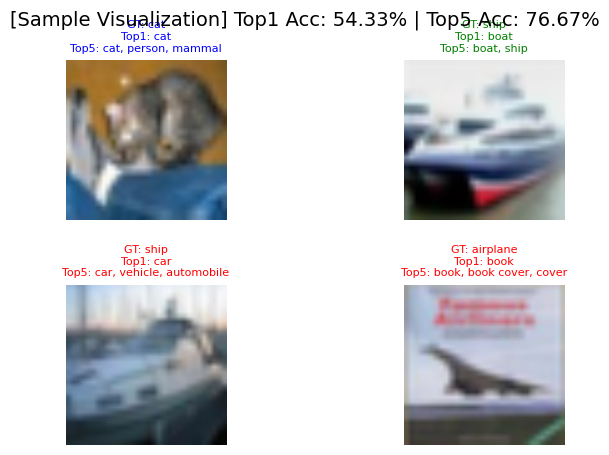


✅ Top1 Accuracy: 163/300 = 54.33%
✅ Top5 Accuracy: 230/300 = 76.67%
⏱️ Elapsed time: 1862.31 sec for 300 samples


In [1]:
import re
import torch
from transformers import AutoProcessor, Gemma3ForConditionalGeneration
from torchvision.datasets import CIFAR10
from torchvision import transforms
from torch.utils.data import DataLoader, Subset
import matplotlib.pyplot as plt
from tqdm import tqdm
from time import time

# 설정
model_name = "google/gemma-3-12b-it"
batch_size = 4
n_visualize = 4  # 시각화할 샘플 수 4개

# Custom collate_fn: PIL 이미지를 그대로 유지 (Tensor 변환 X)
def pil_collate_fn(batch):
    images, labels = zip(*batch)
    return list(images), list(labels)

# CIFAR‑10 로드 (transform 없이 → PIL 이미지 그대로)
data_root = "/data1/bubble3jh/data/CIFAR10"
dataset = CIFAR10(root=data_root, train=False, download=True)
# 데이터셋의 처음 100개만 사용
subset_dataset = Subset(dataset, list(range(300)))
dataloader = DataLoader(subset_dataset, batch_size=batch_size, shuffle=False, collate_fn=pil_collate_fn)

# PIL 이미지 resize (Gemma3는 보통 224×224 입력을 기대)
resize = transforms.Resize((224, 224))

# processor와 모델 로드 (image-text-to-text 전용)
processor = AutoProcessor.from_pretrained(model_name)
model = Gemma3ForConditionalGeneration.from_pretrained(
    model_name, torch_dtype=torch.bfloat16, device_map='auto'
)
model.eval()

def postprocess_output(raw_text):
    """
    raw_text에서 "\nmodel\n" 이후의 문자열를 추출한 후, 
    앞뒤 공백과 구두점(.,:;!? 등)을 제거합니다.
    """
    if "\nmodel\n" in raw_text:
        # "\nmodel\n" 이후의 텍스트 추출
        raw_text = raw_text.split("\nmodel\n")[-1]
    # 앞뒤 공백 및 구두점 제거
    cleaned = raw_text.strip().strip(".,:;!?")
    return cleaned.lower()

# 평가 시, 정규화 및 토큰화 함수는 그대로 사용 (필요 시 수정)
def normalize_and_tokenize(text):
    text = text.lower()
    tokens = re.split(r'[\s,/]+', text)
    tokens = [t for t in tokens if t]
    return tokens

def contains_label(pred, gt):
    tokens = normalize_and_tokenize(pred)
    return gt in tokens

def get_unique_preds_for_sample(single_conversation, initial_unique_preds, min_unique=5, max_iter=3):
    unique_preds = initial_unique_preds.copy()
    iter_count = 0
    single_input = processor.apply_chat_template(
        single_conversation,
        tokenize=True,
        return_dict=True,
        return_tensors="pt",
        add_generation_prompt=True,
        do_pan_and_scan=True
    ).to("cuda")
    
    while len(unique_preds) < min_unique and iter_count < max_iter:
        extra_outputs = model.generate(
            **single_input,
            max_new_tokens=50,
            do_sample=True,
            top_k=50,
            num_return_sequences=5,
        )
        extra_preds = processor.batch_decode(extra_outputs, skip_special_tokens=True)
        # 후처리 적용: "\nmodel\n" 이후 텍스트 추출 후 클린업
        extra_preds = [postprocess_output(pred) for pred in extra_preds]
        for pred in extra_preds:
            if pred not in unique_preds:
                unique_preds.append(pred)
                if len(unique_preds) == min_unique:
                    break
        iter_count += 1
    return unique_preds

# 평가 및 시각화를 위한 변수
correct_top1 = 0
correct_top5 = 0
total = 0
visual_data = []  # 시각화용: top1 결과와 고유한 top5 후보

start_time = time()

# 배치 처리 루프
with torch.no_grad():
    for images, labels in tqdm(dataloader, desc="Batched inference"):
        resized_images = [resize(img) for img in images]
        gt_labels = [dataset.classes[l].lower() for l in labels]

        conversations = [
            [
                {
                    "role": "user",
                    "content": [
                        {"type": "image", "image": img},
                        {"type": "text", "text": "What object is in this image? Please answer only the class name"}
                    ]
                }
            ]
            for img in resized_images
        ]

        inputs = processor.apply_chat_template(
            conversations,
            tokenize=True,
            return_dict=True,
            return_tensors="pt",
            add_generation_prompt=True,
            do_pan_and_scan=True
        ).to("cuda")
        
        # diverse beam search 하이퍼파라미터 조정
        outputs = model.generate(
            **inputs,
            max_new_tokens=50,
            num_beams=10,
            num_return_sequences=10,
            num_beam_groups=5,
            diversity_penalty=1.5,
            output_scores=False,
            return_dict_in_generate=True,
            do_sample=False,
        )
        
        decoded_outputs = processor.batch_decode(outputs.sequences, skip_special_tokens=True)
        
        for i in range(len(labels)):
            beam_outputs = decoded_outputs[i*10:(i+1)*10]
            # 후처리: "\nmodel\n" 이후의 텍스트 추출 및 클린업
            beam_outputs = [postprocess_output(b) for b in beam_outputs]
            
            unique_preds = []
            for pred in beam_outputs:
                if pred not in unique_preds:
                    unique_preds.append(pred)
                if len(unique_preds) == 5:
                    break
            
            if len(unique_preds) < 5:
                unique_preds = get_unique_preds_for_sample(conversations[i], unique_preds, min_unique=5, max_iter=3)
            
            top1_pred = unique_preds[0] if unique_preds else ""
            is_top1_correct = contains_label(top1_pred, gt_labels[i])
            if is_top1_correct:
                correct_top1 += 1
            
            is_top5_correct = any(contains_label(pred, gt_labels[i]) for pred in unique_preds)
            if is_top5_correct:
                correct_top5 += 1
            
            if total < n_visualize:
                visual_data.append((resized_images[i], gt_labels[i], unique_preds, is_top1_correct, is_top5_correct))
            total += 1

torch.cuda.empty_cache()
elapsed = time() - start_time

fig, axes = plt.subplots(2, n_visualize // 2, figsize=(8, 5), gridspec_kw={'hspace': 0.4})  # row 간 여백 추가
for idx, (image, gt, unique_preds, is_top1_correct, is_top5_correct) in enumerate(visual_data):
    ax = axes[idx // (n_visualize // 2)][idx % (n_visualize // 2)]
    ax.imshow(image)
    ax.axis("off")
    title_text = f"GT: {gt}\nTop1: {unique_preds[0] if unique_preds else 'N/A'}\nTop5: {', '.join(unique_preds)}"

    if is_top1_correct:
        color = "blue"
    elif is_top5_correct:
        color = "green"
    else:
        color = "red"

    ax.set_title(title_text, fontsize=8, color=color)



plt.suptitle(f"[Sample Visualization] Top1 Acc: {correct_top1 / total * 100:.2f}% | Top5 Acc: {correct_top5 / total * 100:.2f}%", fontsize=14)
plt.tight_layout()
plt.show()

print(f"\n✅ Top1 Accuracy: {correct_top1}/{total} = {correct_top1 / total * 100:.2f}%")
print(f"✅ Top5 Accuracy: {correct_top5}/{total} = {correct_top5 / total * 100:.2f}%")
print(f"⏱️ Elapsed time: {elapsed:.2f} sec for {total} samples")


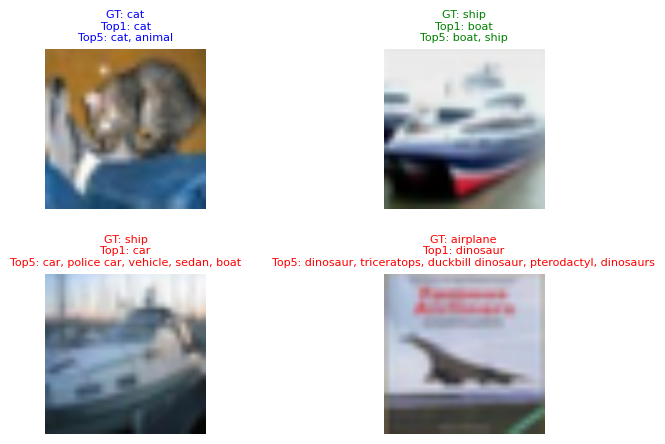

In [2]:
fig, axes = plt.subplots(2, n_visualize // 2, figsize=(8, 5), gridspec_kw={'hspace': 0.4})  # row 간 여백 추가
for idx, (image, gt, unique_preds, is_top1_correct, is_top5_correct) in enumerate(visual_data):
    ax = axes[idx // (n_visualize // 2)][idx % (n_visualize // 2)]
    ax.imshow(image)
    ax.axis("off")
    title_text = f"GT: {gt}\nTop1: {unique_preds[0] if unique_preds else 'N/A'}\nTop5: {', '.join(unique_preds)}"

    if is_top1_correct:
        color = "blue"
    elif is_top5_correct:
        color = "green"
    else:
        color = "red"

    ax.set_title(title_text, fontsize=8, color=color)
